In [1]:
import quandl
import pandas as pd
import numpy as np
import datetime as dt
import pandas_profiling
from time import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

In [2]:
# import libraries here; add more as necessary
import numpy as np
import pandas as pd
from time import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn import preprocessing

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.model_selection import train_test_split
from collections import defaultdict
# Import supplementary visualization code visuals.py
#import visuals as vs
from numpy import concatenate

# magic word for producing visualizations in notebook.allow plots to appear directly in the notebook
%matplotlib inline

In [3]:
quandl.ApiConfig.api_key = "v5Bazu_S389s29HiutZh"

In [4]:
#Get data from Quandl APIs into dataframes
SP500_DIV_YIELD_MONTH = quandl.get('MULTPL/SP500_DIV_YIELD_MONTH') #MULTPLkeys[0]
SP500_PE_RATIO_MONTH = quandl.get('MULTPL/SP500_PE_RATIO_MONTH')
SHILLER_PE_RATIO_MONTH = quandl.get('MULTPL/SHILLER_PE_RATIO_MONTH')
SP500_EARNINGS_YIELD_MONTH = quandl.get('MULTPL/SP500_EARNINGS_YIELD_MONTH')
SP500_INFLADJ_MONTH = quandl.get('MULTPL/SP500_INFLADJ_MONTH')#MULTPLkeys[4]

SP500_PSR_QUARTER = quandl.get('MULTPL/SP500_PSR_QUARTER')
SP500_DIV_MONTH = quandl.get('MULTPL/SP500_DIV_MONTH')
SP500_DIV_YEAR = quandl.get('MULTPL/SP500_DIV_YEAR')
SP500_DIV_GROWTH_YEAR = quandl.get('MULTPL/SP500_DIV_GROWTH_YEAR')
SP500_DIV_GROWTH_QUARTER = quandl.get('MULTPL/SP500_DIV_GROWTH_QUARTER')
SP500_PBV_RATIO_QUARTER = quandl.get('MULTPL/SP500_PBV_RATIO_QUARTER') #MULTPLkeys[10]

SHILLER_PE_RATIO_YEAR = quandl.get('MULTPL/SHILLER_PE_RATIO_YEAR')
SP500_PE_RATIO_YEAR = quandl.get('MULTPL/SP500_PE_RATIO_YEAR')
SP500_DIV_YIELD_YEAR = quandl.get('MULTPL/SP500_DIV_YIELD_YEAR')
SP500_PSR_YEAR = quandl.get('MULTPL/SP500_PSR_YEAR')
SP500_EARNINGS_YIELD_YEAR = quandl.get('MULTPL/SP500_EARNINGS_YIELD_YEAR')
SP500_PBV_RATIO_YEAR =  quandl.get('MULTPL/SP500_PBV_RATIO_YEAR')
SP500_INFLADJ_YEAR =  quandl.get('MULTPL/SP500_INFLADJ_YEAR')
SP500_REAL_PRICE_MONTH = quandl.get('MULTPL/SP500_REAL_PRICE_MONTH') #MULTPLkeys[18]
SP500_SALES_YEAR =  quandl.get('MULTPL/SP500_SALES_YEAR')

SP500_SALES_GROWTH_YEAR = quandl.get('MULTPL/SP500_SALES_GROWTH_YEAR') #MULTPLkeys[20]
SP500_SALES_QUARTER =  quandl.get('MULTPL/SP500_SALES_QUARTER')
SP500_REAL_SALES_GROWTH_QUARTER = quandl.get('MULTPL/SP500_REAL_SALES_GROWTH_QUARTER')
SP500_SALES_GROWTH_QUARTER = quandl.get('MULTPL/SP500_SALES_GROWTH_QUARTER')
SP500_REAL_SALES_GROWTH_YEAR = quandl.get('MULTPL/SP500_REAL_SALES_GROWTH_YEAR')
SP500_REAL_EARNINGS_GROWTH_YEAR = quandl.get('MULTPL/SP500_REAL_EARNINGS_GROWTH_YEAR')
SP500_REAL_SALES_YEAR = quandl.get('MULTPL/SP500_REAL_SALES_YEAR')
SP500_REAL_EARNINGS_GROWTH_QUARTER = quandl.get('MULTPL/SP500_REAL_EARNINGS_GROWTH_QUARTER')
SP500_EARNINGS_GROWTH_QUARTER = quandl.get('MULTPL/SP500_EARNINGS_GROWTH_QUARTER')
SP500_REAL_SALES_QUARTER = quandl.get('MULTPL/SP500_REAL_SALES_QUARTER')

SP500_EARNINGS_MONTH = quandl.get('MULTPL/SP500_EARNINGS_MONTH') #MULTPLkeys[30]
SP500_BVPS_YEAR = quandl.get('MULTPL/SP500_BVPS_YEAR')
SP500_EARNINGS_YEAR = quandl.get('MULTPL/SP500_EARNINGS_YEAR')
SP500_EARNINGS_GROWTH_YEAR = quandl.get('MULTPL/SP500_EARNINGS_GROWTH_YEAR')
SP500_BVPS_QUARTER = quandl.get('MULTPL/SP500_BVPS_QUARTER')
SP500_REAL_PRICE_YEAR = quandl.get('MULTPL/SP500_REAL_PRICE_YEAR') #MULTPLkeys[35]

In [5]:
#API keywords list
MULTPLkeys = [
'MULTPL/SP500_DIV_YIELD_MONTH',
'MULTPL/SP500_PE_RATIO_MONTH',
'MULTPL/SHILLER_PE_RATIO_MONTH',
'MULTPL/SP500_EARNINGS_YIELD_MONTH',
'MULTPL/SP500_INFLADJ_MONTH',
'MULTPL/SP500_PSR_QUARTER',
'MULTPL/SP500_DIV_MONTH',
'MULTPL/SP500_DIV_YEAR',
'MULTPL/SP500_DIV_GROWTH_YEAR',
'MULTPL/SP500_DIV_GROWTH_QUARTER',
'MULTPL/SP500_PBV_RATIO_QUARTER',
'MULTPL/SHILLER_PE_RATIO_YEAR',
'MULTPL/SP500_PE_RATIO_YEAR',
'MULTPL/SP500_DIV_YIELD_YEAR',
'MULTPL/SP500_PSR_YEAR',
'MULTPL/SP500_EARNINGS_YIELD_YEAR',
'MULTPL/SP500_PBV_RATIO_YEAR',
'MULTPL/SP500_INFLADJ_YEAR',
'MULTPL/SP500_REAL_PRICE_MONTH',
'MULTPL/SP500_SALES_YEAR',
'MULTPL/SP500_SALES_GROWTH_YEAR',
'MULTPL/SP500_SALES_QUARTER',
'MULTPL/SP500_REAL_SALES_GROWTH_QUARTER',
'MULTPL/SP500_SALES_GROWTH_QUARTER',
'MULTPL/SP500_REAL_SALES_GROWTH_YEAR',
'MULTPL/SP500_REAL_EARNINGS_GROWTH_YEAR',
'MULTPL/SP500_REAL_SALES_YEAR',
'MULTPL/SP500_REAL_EARNINGS_GROWTH_QUARTER',
'MULTPL/SP500_EARNINGS_GROWTH_QUARTER',
'MULTPL/SP500_REAL_SALES_QUARTER',
'MULTPL/SP500_EARNINGS_MONTH',
'MULTPL/SP500_BVPS_YEAR',
'MULTPL/SP500_EARNINGS_YEAR',
'MULTPL/SP500_EARNINGS_GROWTH_YEAR',
'MULTPL/SP500_BVPS_QUARTER',
'MULTPL/SP500_REAL_PRICE_YEAR'
]

#Split API keywords to create df variable names
var_list = [i.split('/')[1] for i in MULTPLkeys]
print(var_list[0],var_list[1],var_list[2])

SP500_DIV_YIELD_MONTH SP500_PE_RATIO_MONTH SHILLER_PE_RATIO_MONTH


In [6]:
# def get_data(i):
#     return quandl.get('MULTPL/{}'.format(i))

In [7]:
var_list

['SP500_DIV_YIELD_MONTH',
 'SP500_PE_RATIO_MONTH',
 'SHILLER_PE_RATIO_MONTH',
 'SP500_EARNINGS_YIELD_MONTH',
 'SP500_INFLADJ_MONTH',
 'SP500_PSR_QUARTER',
 'SP500_DIV_MONTH',
 'SP500_DIV_YEAR',
 'SP500_DIV_GROWTH_YEAR',
 'SP500_DIV_GROWTH_QUARTER',
 'SP500_PBV_RATIO_QUARTER',
 'SHILLER_PE_RATIO_YEAR',
 'SP500_PE_RATIO_YEAR',
 'SP500_DIV_YIELD_YEAR',
 'SP500_PSR_YEAR',
 'SP500_EARNINGS_YIELD_YEAR',
 'SP500_PBV_RATIO_YEAR',
 'SP500_INFLADJ_YEAR',
 'SP500_REAL_PRICE_MONTH',
 'SP500_SALES_YEAR',
 'SP500_SALES_GROWTH_YEAR',
 'SP500_SALES_QUARTER',
 'SP500_REAL_SALES_GROWTH_QUARTER',
 'SP500_SALES_GROWTH_QUARTER',
 'SP500_REAL_SALES_GROWTH_YEAR',
 'SP500_REAL_EARNINGS_GROWTH_YEAR',
 'SP500_REAL_SALES_YEAR',
 'SP500_REAL_EARNINGS_GROWTH_QUARTER',
 'SP500_EARNINGS_GROWTH_QUARTER',
 'SP500_REAL_SALES_QUARTER',
 'SP500_EARNINGS_MONTH',
 'SP500_BVPS_YEAR',
 'SP500_EARNINGS_YEAR',
 'SP500_EARNINGS_GROWTH_YEAR',
 'SP500_BVPS_QUARTER',
 'SP500_REAL_PRICE_YEAR']

In [8]:
# var_list1 = [
#     'SP500_DIV_YIELD_MONTH1',
#     'SP500_PE_RATIO_MONTH2',
#     'SHILLER_PE_RATIO_MONTH']

In [9]:
# for i in var_list:
#     #i = pd.DataFrame(get_data(i))
#     exec(f'{i} = get_data(i)')
#     #print(get_data(i))
#     print(i)
#     break

In [10]:
# x= 'SP500_DIV_YIELD_MONTH'
# exec("%s = %d" % (x,0))
# print(SP500_DIV_YIELD_MONTH)
# print(x)

#exec(f'{i} = get_data(i)')

In [11]:
# for i in range(len(var_list)//10):
#     x= var_list[i]    
#     exec("%s = %d" % (x,0))
#     #print(var_list[i])
#     #print(x)
#     print(SP500_DIV_YIELD_MONTH)

# # SP500_DIV_YIELD_MONTH = quandl.get(str(MULTPLkeys[0]))

# # print(SP500_DIV_YIELD_MONTH.head())
# #SP500_DIV_YIELD_MONTH
# #SP500_PE_RATIO_MONTH
# #SHILLER_PE_RATIO_MONTH

# #dynamic variables
# x= var_list[1]    
# exec("%s = %s" % (x,x))
# SP500_PE_RATIO_MONTH



In [12]:
print(SP500_REAL_PRICE_MONTH.head())
print(SP500_EARNINGS_YIELD_MONTH.head())

            Value
Date             
1871-01-01   4.44
1871-02-01   4.50
1871-03-01   4.61
1871-04-01   4.74
1871-05-01   4.86
            Value
Date             
1871-01-01   9.01
1871-02-01   8.89
1871-03-01   8.68
1871-04-01   8.44
1871-05-01   8.23


df = pd.merge(pd.merge(SP500_REAL_PRICE_MONTH,SP500_EARNINGS_YIELD_MONTH,on='Date'),SHILLER_PE_RATIO_MONTH,on='Date')
df.head()

Assumptions-
1. Assuming SP500_REAL_PRICE_MONTH is remains same on 1st of every month and last day of that month to remove NaN values.
2. SP500_DIV_YIELD_MONTH and yield values are available for last day of every month. Assuming it remains the same on first of next month by carrying over the same value to first day of next month.

    outer join between price and monthly yield df to include all dates of every month.

    SP500_REAL_PRICE_MONTH is the target label hence start with this df to include all rows 

In [13]:
SP500_DIV_YIELD_MONTH.head()

,Value
Date,
1871-01-31,5.86
1871-02-28,5.78
1871-03-31,5.64
1871-04-30,5.49
1871-05-31,5.35


In [14]:
#Join all month dataframes together on Date column.

df = SP500_REAL_PRICE_MONTH.join(SP500_DIV_YIELD_MONTH,on=None,how='outer',
                                  lsuffix='_SP500_REAL_PRICE_MONTH',rsuffix='_SP500_DIV_YIELD_MONTH',sort=False)

df= df.join(SP500_PE_RATIO_MONTH,on='Date',how='left',sort=False)

df = df.merge(
    SHILLER_PE_RATIO_MONTH,on='Date',how='left').merge(
    SP500_EARNINGS_YIELD_MONTH,on='Date',how='left').merge(
    SP500_INFLADJ_MONTH,on='Date',how='left').merge(
    SP500_PSR_QUARTER,on='Date',how='left').merge(
    SP500_DIV_MONTH,on='Date',how='outer').merge(
    SP500_DIV_YEAR,on='Date',how='left')


df.columns = ['Value_SP500_REAL_PRICE_MONTH','Value_SP500_DIV_YIELD_MONTH','Value_SP500_PE_RATIO_MONTH',
                'Value_SHILLER_PE_RATIO_MONTH','Value_SP500_EARNINGS_YIELD_MONTH','Value_SP500_INFLADJ_MONTH',
              'Value_SP500_PSR_QUARTER','Value_SP500_DIV_MONTH','Value_SP500_DIV_YEAR'
             ]

#print(df.head(6))
print(df.columns)
print(df.shape)

Index(['Value_SP500_REAL_PRICE_MONTH', 'Value_SP500_DIV_YIELD_MONTH',
       'Value_SP500_PE_RATIO_MONTH', 'Value_SHILLER_PE_RATIO_MONTH',
       'Value_SP500_EARNINGS_YIELD_MONTH', 'Value_SP500_INFLADJ_MONTH',
       'Value_SP500_PSR_QUARTER', 'Value_SP500_DIV_MONTH',
       'Value_SP500_DIV_YEAR'],
      dtype='object')
(3548, 9)


In [15]:
def Merge__Rename_function(df,df_var,column_name):
    df = df.merge(df_var,on='Date',how='outer')
    Column_name = 'Value_' + str(column_name)
    #print(Column_name)
    df.rename({'Value':Column_name},axis=1,inplace=True)
    #print(df.head(6))
    print(df.shape)
    #print(df.columns)
    
    return df

In [16]:
var_list

['SP500_DIV_YIELD_MONTH',
 'SP500_PE_RATIO_MONTH',
 'SHILLER_PE_RATIO_MONTH',
 'SP500_EARNINGS_YIELD_MONTH',
 'SP500_INFLADJ_MONTH',
 'SP500_PSR_QUARTER',
 'SP500_DIV_MONTH',
 'SP500_DIV_YEAR',
 'SP500_DIV_GROWTH_YEAR',
 'SP500_DIV_GROWTH_QUARTER',
 'SP500_PBV_RATIO_QUARTER',
 'SHILLER_PE_RATIO_YEAR',
 'SP500_PE_RATIO_YEAR',
 'SP500_DIV_YIELD_YEAR',
 'SP500_PSR_YEAR',
 'SP500_EARNINGS_YIELD_YEAR',
 'SP500_PBV_RATIO_YEAR',
 'SP500_INFLADJ_YEAR',
 'SP500_REAL_PRICE_MONTH',
 'SP500_SALES_YEAR',
 'SP500_SALES_GROWTH_YEAR',
 'SP500_SALES_QUARTER',
 'SP500_REAL_SALES_GROWTH_QUARTER',
 'SP500_SALES_GROWTH_QUARTER',
 'SP500_REAL_SALES_GROWTH_YEAR',
 'SP500_REAL_EARNINGS_GROWTH_YEAR',
 'SP500_REAL_SALES_YEAR',
 'SP500_REAL_EARNINGS_GROWTH_QUARTER',
 'SP500_EARNINGS_GROWTH_QUARTER',
 'SP500_REAL_SALES_QUARTER',
 'SP500_EARNINGS_MONTH',
 'SP500_BVPS_YEAR',
 'SP500_EARNINGS_YEAR',
 'SP500_EARNINGS_GROWTH_YEAR',
 'SP500_BVPS_QUARTER',
 'SP500_REAL_PRICE_YEAR']

In [17]:
df = Merge__Rename_function(df,SP500_DIV_GROWTH_YEAR,'SP500_DIV_GROWTH_YEAR')
df = Merge__Rename_function(df,SP500_DIV_GROWTH_QUARTER,'SP500_DIV_GROWTH_QUARTER')
df = Merge__Rename_function(df,SP500_PBV_RATIO_QUARTER,'SP500_PBV_RATIO_QUARTER')

df = Merge__Rename_function(df,SHILLER_PE_RATIO_YEAR,'SHILLER_PE_RATIO_YEAR')
df = Merge__Rename_function(df,SP500_PE_RATIO_YEAR,'SP500_PE_RATIO_YEAR')
df = Merge__Rename_function(df,SP500_DIV_YIELD_YEAR,'SP500_DIV_YIELD_YEAR')
df = Merge__Rename_function(df,SP500_PSR_YEAR,'SP500_PSR_YEAR')
df = Merge__Rename_function(df,SP500_EARNINGS_YIELD_YEAR,'SP500_EARNINGS_YIELD_YEAR')
df = Merge__Rename_function(df,SP500_PBV_RATIO_YEAR,'SP500_PBV_RATIO_YEAR')
df = Merge__Rename_function(df,SP500_INFLADJ_YEAR,'SP500_INFLADJ_YEAR')

df = Merge__Rename_function(df,SP500_SALES_YEAR,'SP500_SALES_YEAR')
df = Merge__Rename_function(df,SP500_SALES_GROWTH_YEAR,'SP500_SALES_GROWTH_YEAR')
df = Merge__Rename_function(df,SP500_SALES_QUARTER,'SP500_SALES_QUARTER')
df = Merge__Rename_function(df,SP500_REAL_SALES_GROWTH_QUARTER,'SP500_REAL_SALES_GROWTH_QUARTER')
df = Merge__Rename_function(df,SP500_SALES_GROWTH_QUARTER,'SP500_SALES_GROWTH_QUARTER')
df = Merge__Rename_function(df,SP500_REAL_SALES_GROWTH_YEAR,'SP500_REAL_SALES_GROWTH_YEAR')
df = Merge__Rename_function(df,SP500_REAL_EARNINGS_GROWTH_YEAR,'SP500_REAL_EARNINGS_GROWTH_YEAR')
df = Merge__Rename_function(df,SP500_REAL_SALES_YEAR,'SP500_REAL_SALES_YEAR')

df = Merge__Rename_function(df,SP500_REAL_EARNINGS_GROWTH_QUARTER,var_list[27])
df = Merge__Rename_function(df,SP500_EARNINGS_GROWTH_QUARTER,var_list[28])
df = Merge__Rename_function(df,SP500_REAL_SALES_QUARTER,var_list[29])
df = Merge__Rename_function(df,SP500_EARNINGS_MONTH,var_list[30])
df = Merge__Rename_function(df,SP500_BVPS_YEAR,var_list[31])
df = Merge__Rename_function(df,SP500_EARNINGS_YEAR,var_list[32])
df = Merge__Rename_function(df,SP500_EARNINGS_GROWTH_YEAR,var_list[33])
df = Merge__Rename_function(df,SP500_BVPS_QUARTER,var_list[34])
#df = Merge__Rename_function(df,SP500_REAL_PRICE_YEAR,var_list[35])

df.columns

(3553, 10)
(3559, 11)
(3559, 12)
(3559, 13)
(3559, 14)
(3559, 15)
(3559, 16)
(3559, 17)
(3559, 18)
(3559, 19)
(3559, 20)
(3559, 21)
(3559, 22)
(3559, 23)
(3559, 24)
(3559, 25)
(3559, 26)
(3559, 27)
(3559, 28)
(3559, 29)
(3559, 30)
(3559, 31)
(3559, 32)
(3559, 33)
(3559, 34)
(3559, 35)


Index(['Value_SP500_REAL_PRICE_MONTH', 'Value_SP500_DIV_YIELD_MONTH',
       'Value_SP500_PE_RATIO_MONTH', 'Value_SHILLER_PE_RATIO_MONTH',
       'Value_SP500_EARNINGS_YIELD_MONTH', 'Value_SP500_INFLADJ_MONTH',
       'Value_SP500_PSR_QUARTER', 'Value_SP500_DIV_MONTH',
       'Value_SP500_DIV_YEAR', 'Value_SP500_DIV_GROWTH_YEAR',
       'Value_SP500_DIV_GROWTH_QUARTER', 'Value_SP500_PBV_RATIO_QUARTER',
       'Value_SHILLER_PE_RATIO_YEAR', 'Value_SP500_PE_RATIO_YEAR',
       'Value_SP500_DIV_YIELD_YEAR', 'Value_SP500_PSR_YEAR',
       'Value_SP500_EARNINGS_YIELD_YEAR', 'Value_SP500_PBV_RATIO_YEAR',
       'Value_SP500_INFLADJ_YEAR', 'Value_SP500_SALES_YEAR',
       'Value_SP500_SALES_GROWTH_YEAR', 'Value_SP500_SALES_QUARTER',
       'Value_SP500_REAL_SALES_GROWTH_QUARTER',
       'Value_SP500_SALES_GROWTH_QUARTER',
       'Value_SP500_REAL_SALES_GROWTH_YEAR',
       'Value_SP500_REAL_EARNINGS_GROWTH_YEAR', 'Value_SP500_REAL_SALES_YEAR',
       'Value_SP500_REAL_EARNINGS_GROWTH_QUARTER'

In [18]:
df.head()

,Value_SP500_REAL_PRICE_MONTH,Value_SP500_DIV_YIELD_MONTH,Value_SP500_PE_RATIO_MONTH,Value_SHILLER_PE_RATIO_MONTH,Value_SP500_EARNINGS_YIELD_MONTH,Value_SP500_INFLADJ_MONTH,Value_SP500_PSR_QUARTER,Value_SP500_DIV_MONTH,Value_SP500_DIV_YEAR,Value_SP500_DIV_GROWTH_YEAR,...,Value_SP500_REAL_EARNINGS_GROWTH_YEAR,Value_SP500_REAL_SALES_YEAR,Value_SP500_REAL_EARNINGS_GROWTH_QUARTER,Value_SP500_EARNINGS_GROWTH_QUARTER,Value_SP500_REAL_SALES_QUARTER,Value_SP500_EARNINGS_MONTH,Value_SP500_BVPS_YEAR,Value_SP500_EARNINGS_YEAR,Value_SP500_EARNINGS_GROWTH_YEAR,Value_SP500_BVPS_QUARTER
Date,,,,,,,,,,,,,,,,,,,,,
1871-01-01,4.44,NaN,11.10,NaN,9.01,89.81,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1871-01-31,NaN,5.86,NaN,NaN,NaN,NaN,NaN,5.26,5.15,NaN,...,NaN,NaN,NaN,NaN,NaN,8.09,NaN,7.92,NaN,NaN
1871-02-01,4.50,NaN,11.25,10.92,8.89,88.33,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1871-02-28,NaN,5.78,NaN,NaN,NaN,NaN,NaN,5.10,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,7.85,NaN,NaN,NaN,NaN
1871-03-01,4.61,NaN,11.52,11.19,8.68,89.17,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
#Pandas profiling of df
pandas_profiling.ProfileReport(df)

Number of variables,36
Number of observations,3559
Total Missing (%),15.2%
Total size in memory,1001.0 KiB
Average record size in memory,288.0 B
Numeric,8
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,27


In [20]:
def Column_missing_values(df):
    '''
    Function to find missing values or NaN values per column and print percentage of missing values per column
    in bar chart.
    IN - any pandas dataframe 
    '''
    #Percentage of missing values per column
    missing_columns = df.isnull().sum()
    if missing_columns.values.any() != 0:
        missing_columns = (missing_columns[missing_columns>0]/df.shape[0]) * 100
        missing_columns.sort_values(inplace=True)
        missing_columns.plot.bar(title = 'Column wise percentage missing values', figsize=(8,4))
    else:
        print('No missing values in provided dataframe')
        
    return

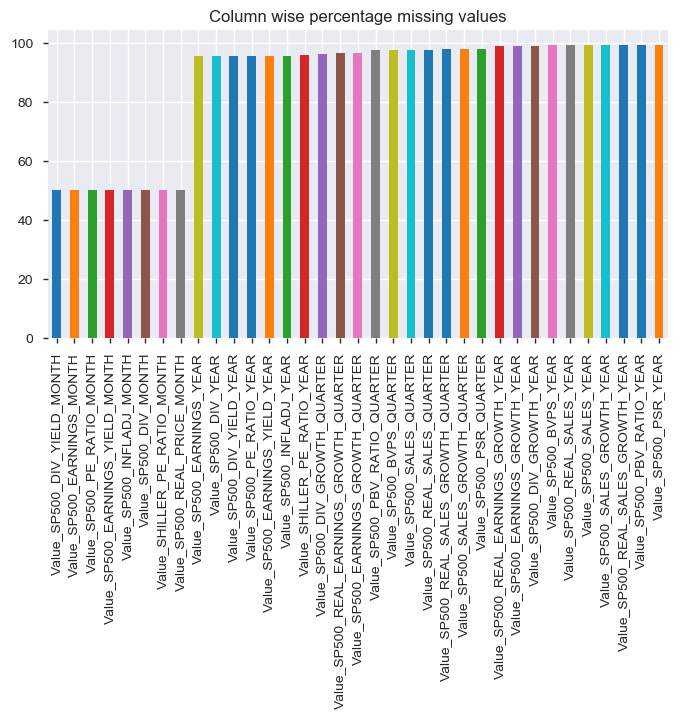

In [21]:
Column_missing_values(df)

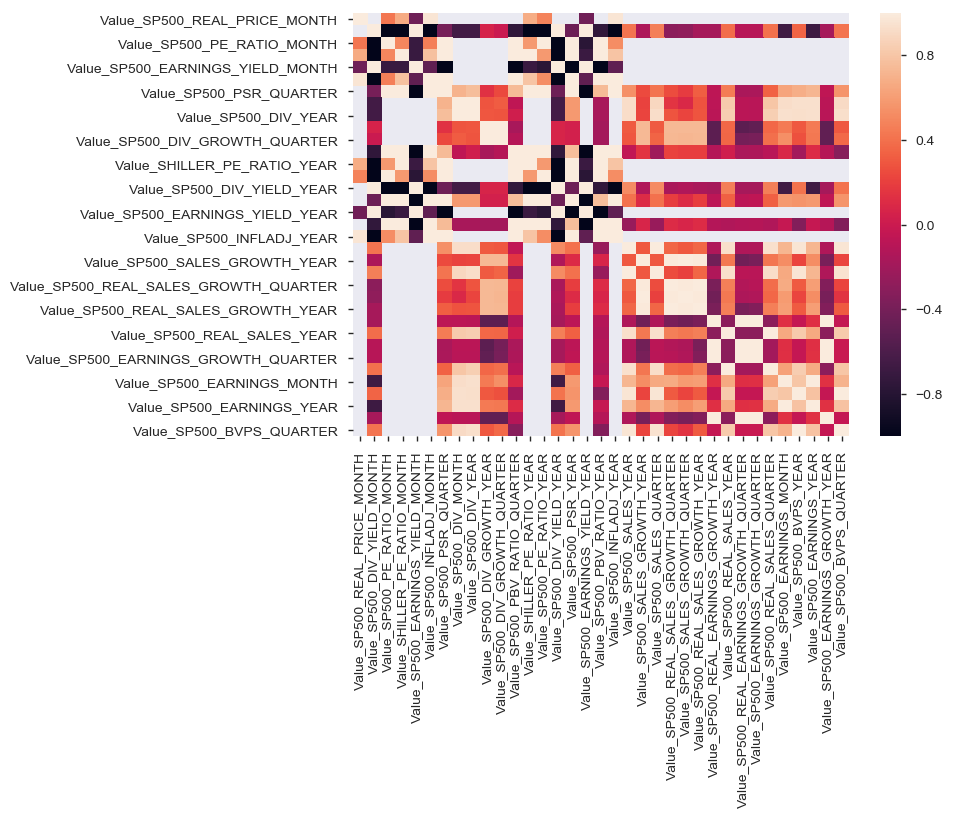

In [22]:
#Correlation plot for numerical encoded version of API data in df.
sns.heatmap(df.corr(),annot=None,fmt='.2f',square=False)

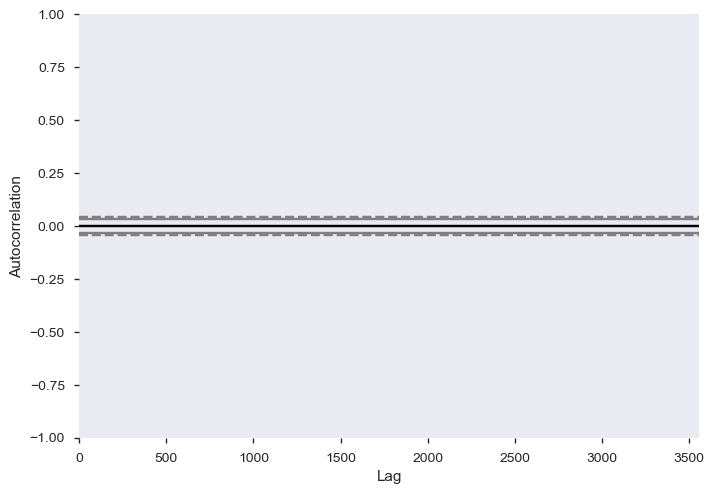

In [23]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(df)
plt.show()

In [24]:
#Drop last rows with NaN values for Value_SP500_REAL_PRICE_MONTH because these were outlier with no price values.
df.drop(df.tail(11).index,axis=0,inplace=True)

# Impute and Interpolate missing values

Original dataset has many missing or NaN values which is noise to end results. General methods like replacing with mean values can not be applied because it would add bias to the timeseries dataset. 

In [25]:
import  impyute.imputation.cs 
import impyute.imputation.ts
from sklearn.preprocessing import Imputer
from sklearn.impute import SimpleImputer, MissingIndicator
from statsmodels.tsa.arima_model import ARIMA
from sklearn.model_selection import cross_val_score

In [26]:
#Create an imputation object
imputer_most_frequent= SimpleImputer(missing_values=np.nan,strategy ='most_frequent')
#Inject imputed values in the dataset.
df_imputed = pd.DataFrame(imputer_most_frequent.fit_transform(df))
df_imputed.columns = df.columns
df_imputed.index = df.index

In [27]:
pandas_profiling.ProfileReport(df_imputed)

Number of variables,36
Number of observations,3548
Total Missing (%),0.0%
Total size in memory,998.0 KiB
Average record size in memory,288.0 B
Numeric,25
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,10


In [28]:
#Apply linear interpolation on the dataset.
df_interpolate = df.interpolate(method='linear',axis=0,inplace=False,limit_direction='both')

In [29]:
print(df_imputed.shape)
print(df_interpolate.shape)

(3548, 35)
(3548, 35)


In [30]:
#Full profile on interpolated dataset.
pandas_profiling.ProfileReport(df_interpolate)

Number of variables,36
Number of observations,3548
Total Missing (%),0.0%
Total size in memory,998.0 KiB
Average record size in memory,288.0 B
Numeric,13
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,22


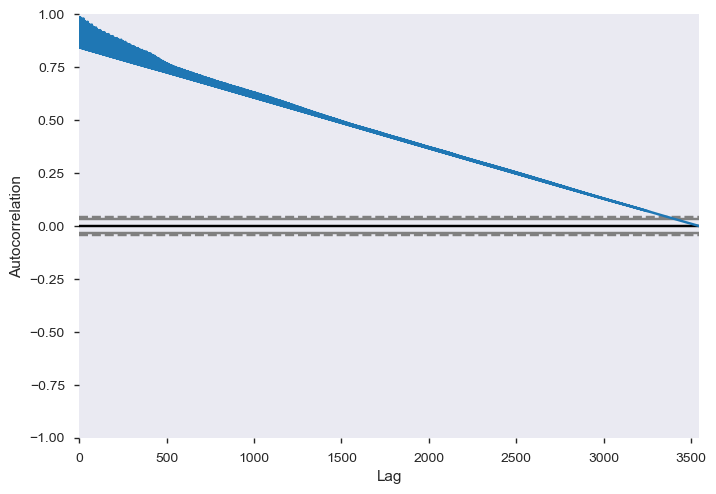

In [31]:
autocorrelation_plot(df_imputed)
plt.show()

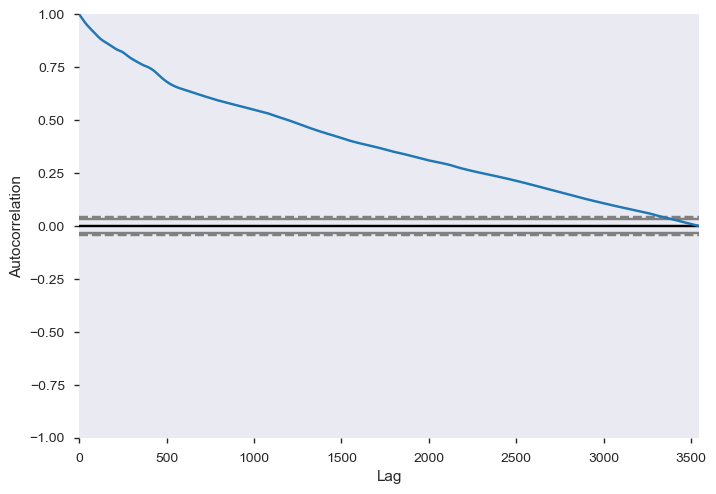

In [32]:
autocorrelation_plot(df_interpolate)
plt.show()

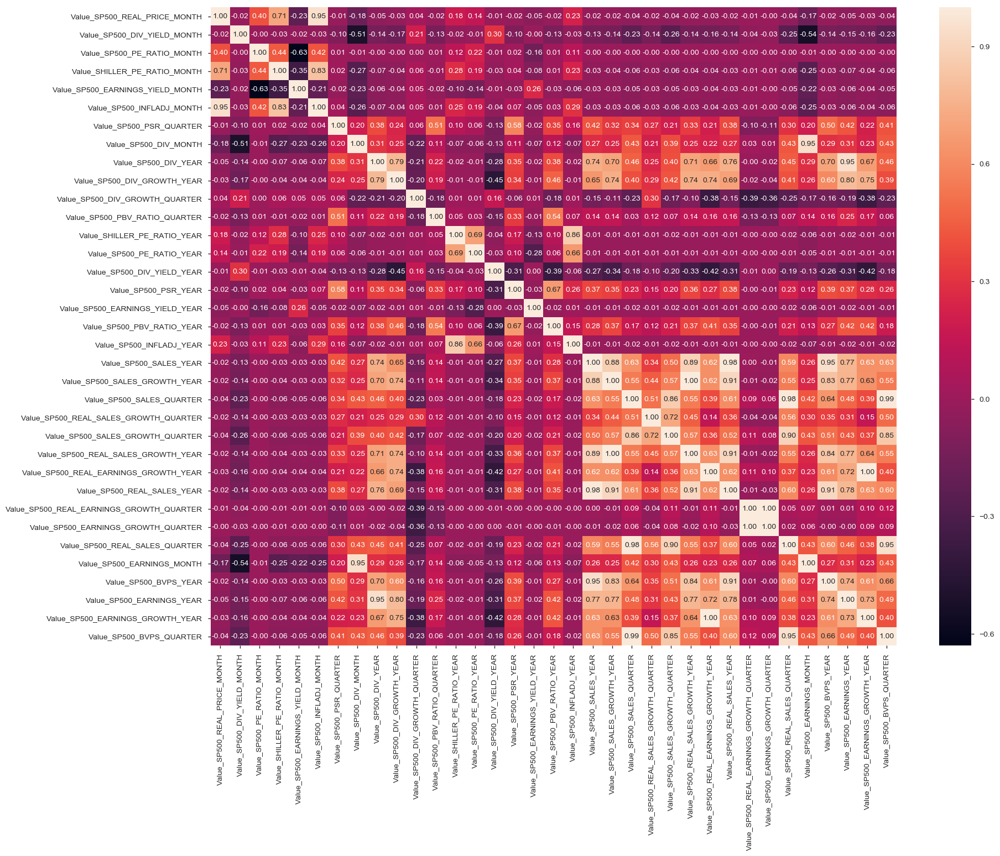

In [33]:
#Corelation plot after imputation
plt.figure(figsize=(20,15))
sns.heatmap(df_imputed.corr(),annot=True,fmt='.2f',square=False)

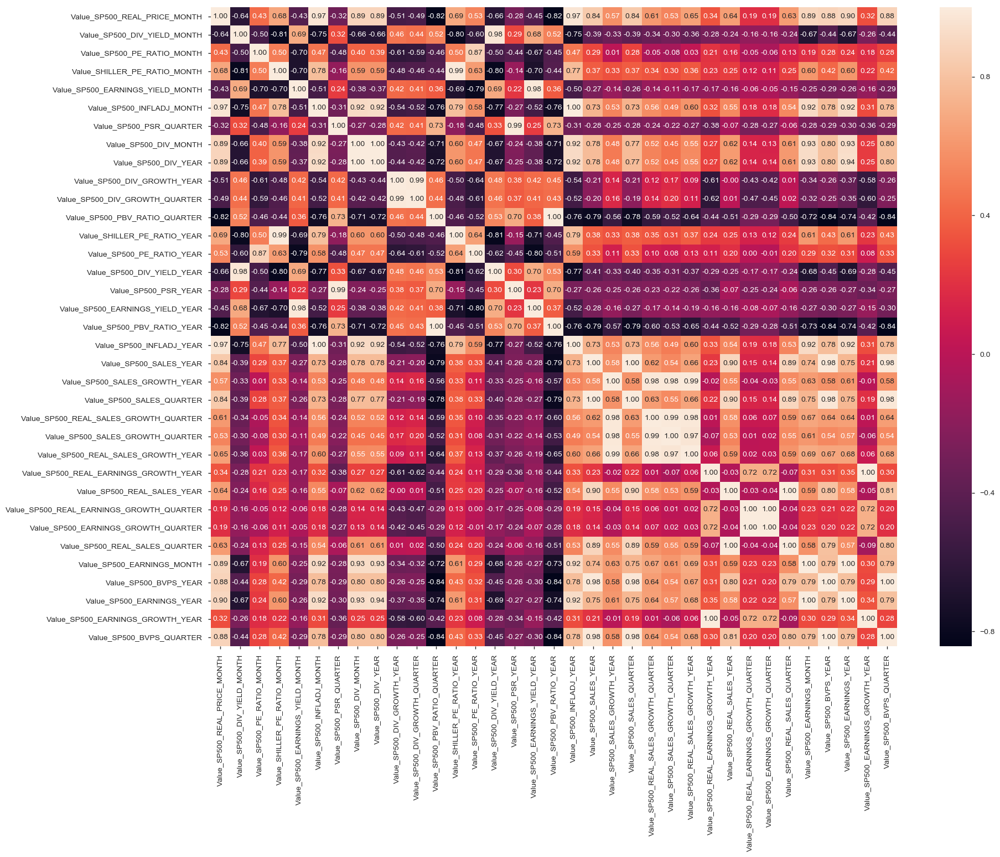

In [34]:
#Correlation heatmap plot after interpolation
plt.figure(figsize=(20,15))
sns.heatmap(df_interpolate.corr(),annot=True,fmt='.2f',square=False)

In [35]:
#Check for missing values per column and create a graph
Column_missing_values(df_imputed)
Column_missing_values(df_interpolate)

No missing values in provided dataframe
No missing values in provided dataframe


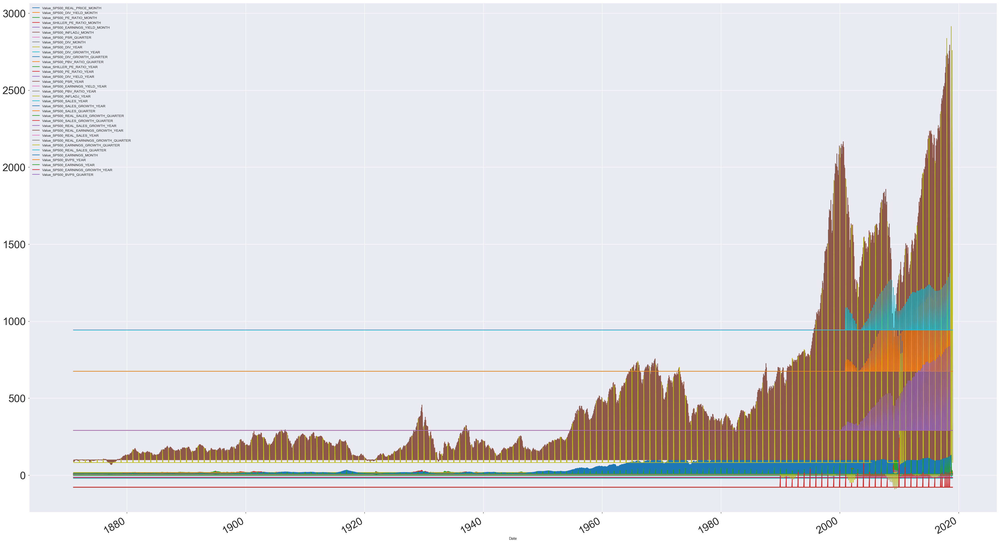

In [36]:
df_imputed.plot(figsize=(50,30),fontsize=30)

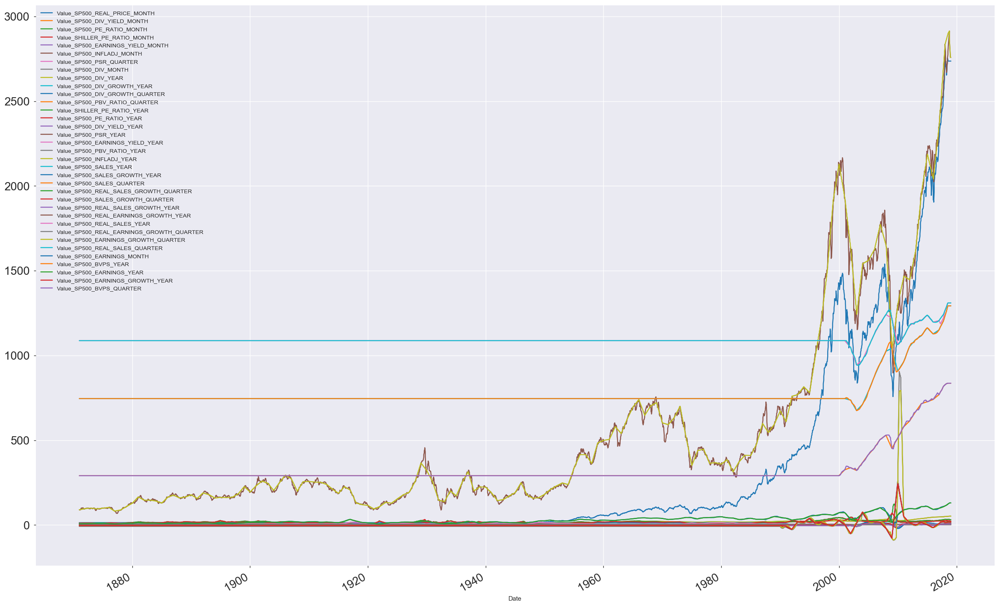

In [37]:
df_interpolate.plot(figsize=(30,20),fontsize=20)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000023B2D558B00>,
      dtype=object)

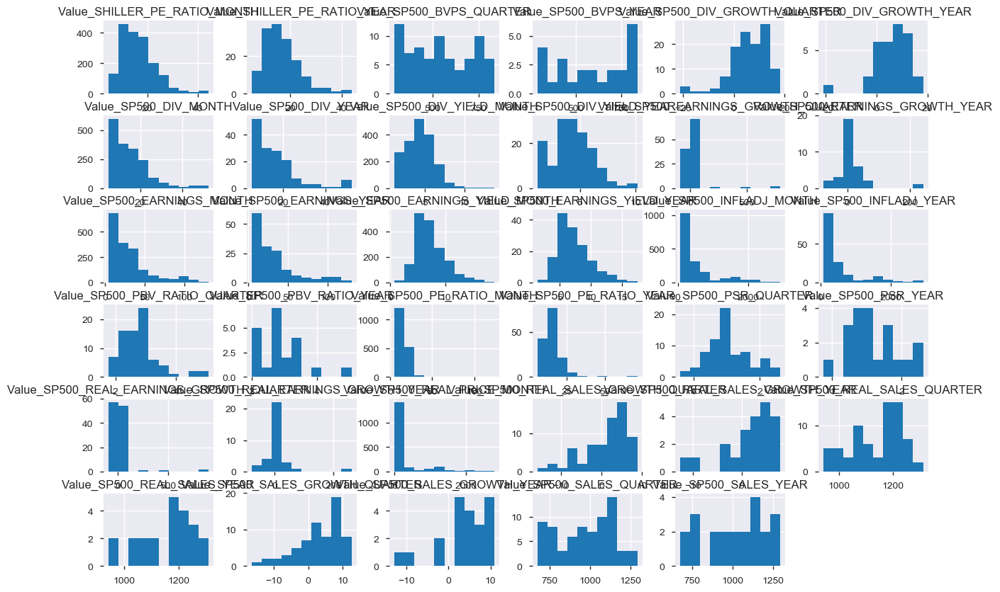

In [38]:
df.hist(figsize=(15,10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000023B302BD080>,
      dtype=object)

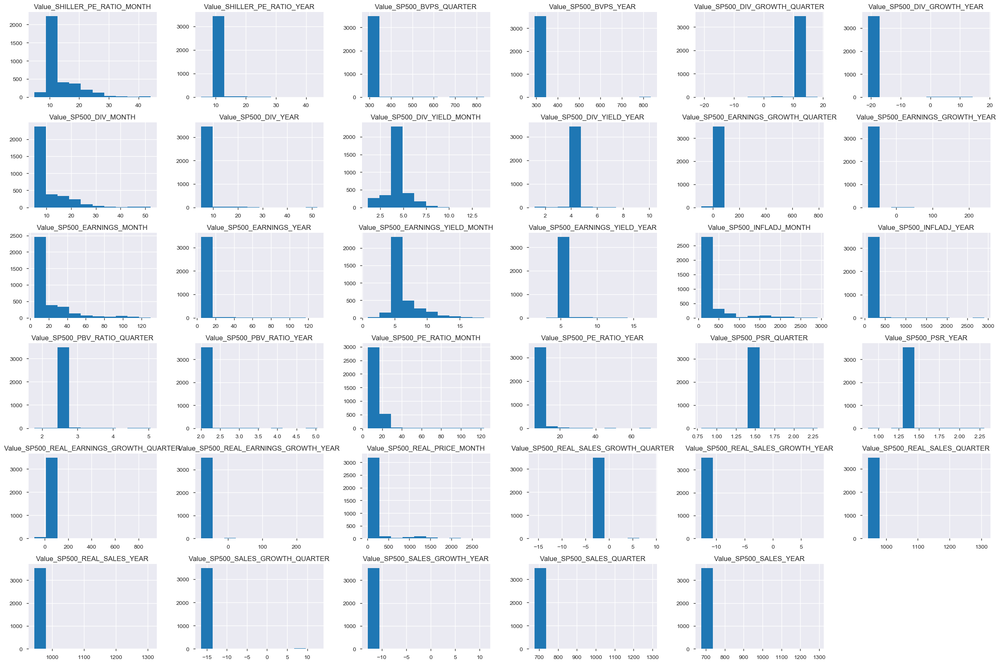

In [39]:
df_imputed.hist(figsize=(30,20))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000023B3133FBA8>,
      dtype=object)

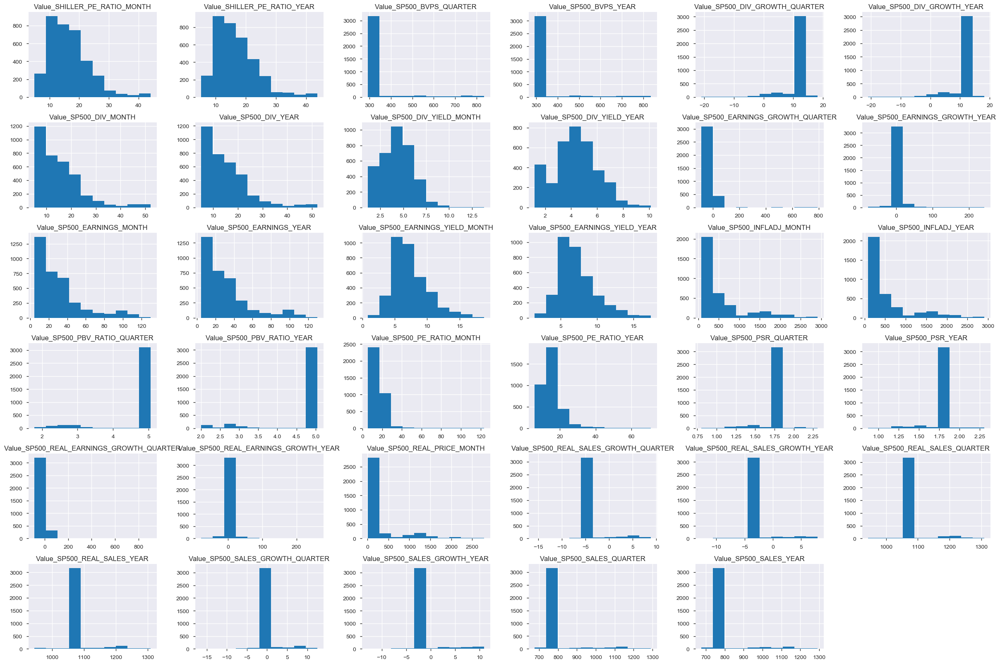

In [40]:
#Histogram plot of all variables in interpolated dataset
df_interpolate.hist(figsize=(30,20))

# Final  analysis on interpolation and imputation datasets.

    linear Interpolation on missing values looks promising and there is better correlation between variables of the dataset. Imputation has not shown better correlation between variables. I would use interpolation dataframe for further analysis.

# Write dfs to csv files for further reference.

save df, df_imputed and df_iterpolated to csv file.

In [41]:
#Write dfs to csv file.
df.to_csv('SandP500_Index_Master.csv',index=False)
df_imputed.to_csv('SandP500_Index_df_imputed.csv',index=False)
df_interpolate.to_csv('SandP500_Index_df_Interpolated.csv',index=False)

# Feature Scaling
    
    Apply StandardScaler() to the imputed df and interpolated df to normalize feature values.

In [42]:
# Apply feature scaling on all values to the entire numerical dataframe.define function
def Apply_Standard_Scaler(df):
    '''
    This funtion applies StandardScaler() to columns/features of a given dataframe.
    IN- a pandas dataframe
    OUT - df_scaled_features dataframe of scaled features.
    scaler - StandardScaler() object.    
    '''
    scaler = StandardScaler()
    scaled_features = StandardScaler().fit_transform(df.values)
    df_scaled_features = pd.DataFrame(scaled_features,index=df.index,columns = df.columns)
    #df_scaled_features.describe()
    
    return df_scaled_features, scaler

In [43]:
print ('Number of columns present in imputed and interpolated datasets are : {} & {}'.format (
    len(df_imputed.columns),len(df_interpolate.columns)))

Number of columns present in imputed and interpolated datasets are : 35 & 35


In [44]:
# Apply standard scaling function to both dfs and return scaled df.
df_scaled_features_imputed, scaler_df_imputed = Apply_Standard_Scaler(df_imputed)
df_scaled_features_interpolation, scaler_df_interpolate = Apply_Standard_Scaler(df_interpolate)

# Apply Principal Component Analysis (PCA) for feature selection

    Apply PCA feature extraction analysis to find groups of features with highest and lowest variance.

In [45]:
#function to apply PCA feature scaling
def scree_plot(pca):
    '''
    Creates a scree plot associated with the principal components 
    
    INPUT: pca - the result of instance of PCA in scikit learn
            
    OUTPUT:
            None
    '''
    num_components = len(pca.explained_variance_ratio_)
    ind = np.arange(num_components)
    vals = pca.explained_variance_ratio_
 
    plt.figure(figsize=(25, 10))
    ax = plt.subplot(111)
    cumvals = np.cumsum(vals)
    ax.bar(ind, vals)
    ax.plot(ind, cumvals)
    #print (ind, cumvals)
    for i in range(num_components):
        ax.annotate(r"%s%%" % ((str(vals[i]*100)[:4])), (ind[i]+0.2, vals[i]), va="bottom", ha="center", fontsize=12)
     
 
    ax.xaxis.set_tick_params(width=0)
    ax.yaxis.set_tick_params(width=2, length=12)
 
    ax.set_xlabel("Principal Component")
    ax.set_ylabel("Variance Explained (%)")
    plt.title('Explained Variance Per Principal Component')
    

# Apply PCA to the data for all features
def Apply_PCA(df_scaled_features,n_components):
    '''
    This function would create a PCA object in scikit-learn with n_components and apply fit_transform function of PCA on scaled features df.
    This function internally calls another 'scree_plot' function to create a chart of feature variance.
    IN - 
    df_scaled_features - numerically scaled dataframe.
    n_components - n number of components for PCA feature analysis
    
    Output- Returns PCA object with provided n_components
    '''
    pca = PCA(n_components)
    pca_scaled_features = pca.fit_transform(df_scaled_features)
    scree_plot(pca)
    
    return pca


# Map weights for the first principal component to corresponding feature names
# and then print the linked values, sorted by weight.
def sorted_weights(pca, ix, dataset):
    """
    Docstring- map the weights and components from PCA analysis.
    Input parameters-
    Input - pca initialized model
    ix = index number of first set of components.
    dataset = a dataframe of scaled features
    
    Output- A Tuple of features with variance.
    Prints a bar chart with feature names and related variance.
    """
    a1 = pca.components_[ix]
    a2 = dataset.keys().values
    a = list(zip(a1, a2))
    a.sort(key=lambda tup: tup[0])
    x_labels = [val[0] for val in a]
    y_labels = [val[1] for val in a]
    plt.Figure(figsize=(20, 15))
    ax = pd.Series(x_labels).plot(kind='bar')
    ax.set_xticklabels(y_labels)
    rects = ax.patches
    # for rect, label in zip(rects, x_labels):
    #     height = rect.get_height()
    #     ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
    return a


#Cluster of of features with highest variance
def Print_PCAfeatures_graph(df,a,n):
    '''
    Function to print PCA features in line chart with top n lowest variance or top n highest variance for a dataframe.
    IN- 
    df- dataframe on which PCA analysis was done.
    a - result from 'sorted_weights' function. A sequence of 2-d array with sorted weights of features.
    n- number of features required to be printed in the chart. Negative (-n) shall show features with positive variance while 
    positive (n) would show features with negative variance.
    
    OUT- name of features from cluster a.
    '''    
    groups = []
    for i in range(len(a)):
        groups.append(a[i][1])
    
    #Slice 1-D array appropriately
    if n < 0:
        groups = groups[n:]
    else:
        groups = groups[:n]
    
    #print(groups)
    
    i = 1
    for group in groups:
        plt.subplot(len(groups), 1, i)
        plt.plot(df[group].values)
        plt.title(group, y=0.5, loc='center')
        i += 1
    plt.figure(figsize=(30,20))
    plt.show()
    
    return groups

    Visualize PCA feature extraction and variance for imputed and interpolated dfs

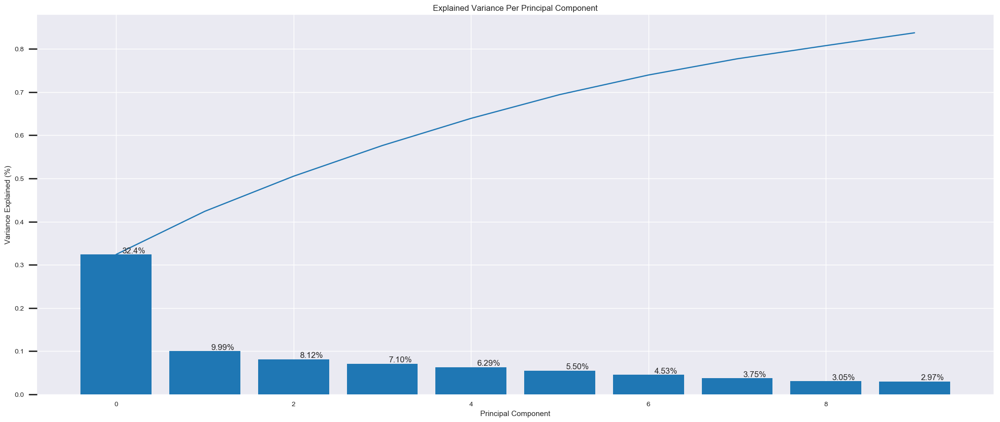

In [46]:
#Apply PCA for all features except target output.
pca_imputed = Apply_PCA(df_scaled_features_imputed.drop(['Value_SP500_REAL_PRICE_MONTH'],axis=1),n_components=10)

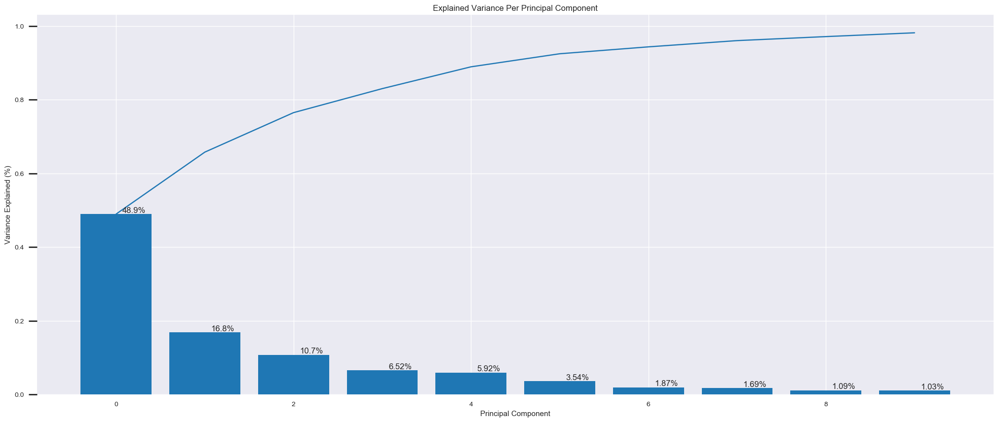

In [47]:
#Apply PCA for all features except target output.
pca_interpolated = Apply_PCA(df_scaled_features_interpolation.drop(['Value_SP500_REAL_PRICE_MONTH'],axis=1),n_components=10)

    Visualize weights of features for first group of extracted features with highest variance

In [48]:
# #Cluster of of features with highest variance
# def Print_PCAfeatures_graph(df,a,n):
#     '''
#     Function to print PCA features in line chart with top n lowest variance or top n highest variance for a dataframe.
#     IN- 
#     df- dataframe on which PCA analysis was done.
#     a - result from 'sorted_weights' function. A sequence of 2-d array with sorted weights of features.
#     n- number of features required to be printed in the chart. Negative (-n) shall show features with maximum variance while 
#     positive n would show features with lowest variance.
    
#     OUT- name of features from cluster a.
#     '''    
#     groups = []
#     for i in range(len(a)):
#         groups.append(a[i][1])
    
#     #Slice 1-D array appropriately
#     if n < 0:
#         groups = groups[n:]
#     else:
#         groups = groups[:n]
    
#     #print(groups)
    
#     i = 1
#     for group in groups:
#         plt.subplot(len(groups), 1, i)
#         plt.plot(df[group].values)
#         plt.title(group, y=0.5, loc='center')
#         i += 1
#     plt.figure(figsize=(30,20))
#     plt.show()
    
#     return groups

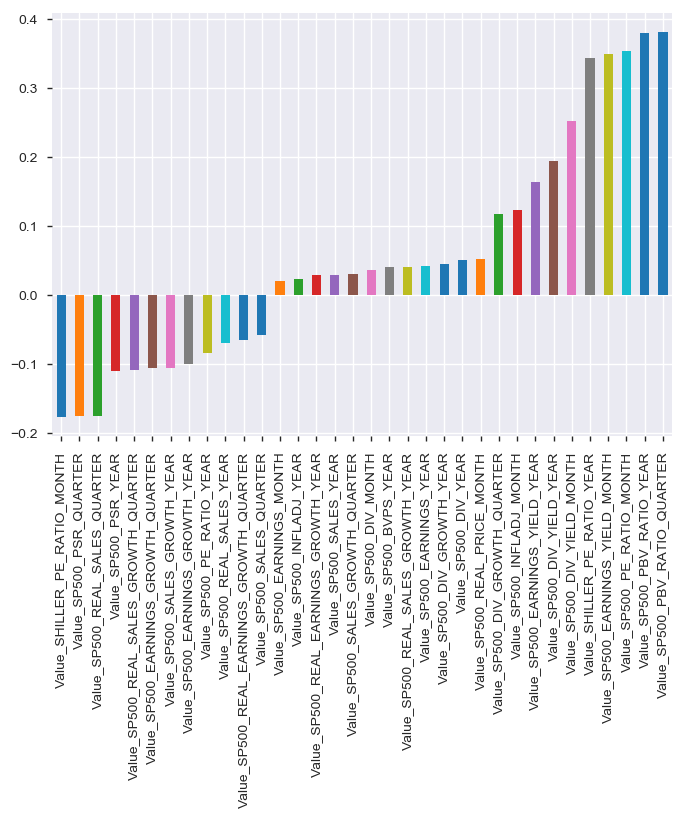

In [49]:
#List cluster of features with highest variance from PCA analysis
a = sorted_weights(pca_imputed,1,df_scaled_features_imputed)

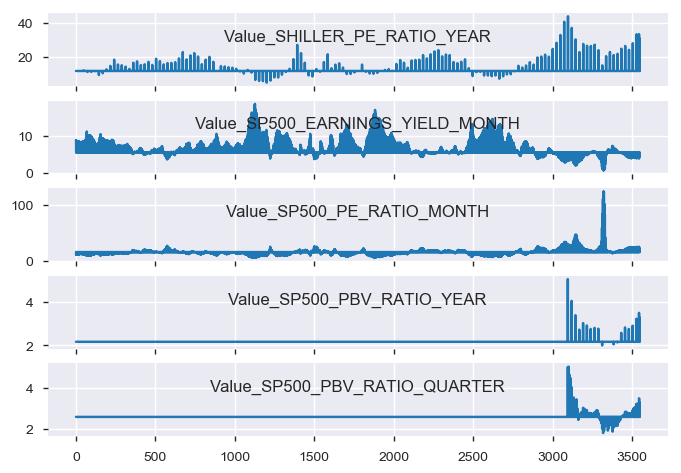

<Figure size 3000x2000 with 0 Axes>

['Value_SHILLER_PE_RATIO_YEAR',
 'Value_SP500_EARNINGS_YIELD_MONTH',
 'Value_SP500_PE_RATIO_MONTH',
 'Value_SP500_PBV_RATIO_YEAR',
 'Value_SP500_PBV_RATIO_QUARTER']

In [50]:
#print chart with top 5 features with maximum variance
Print_PCAfeatures_graph(df_imputed,a,-5)

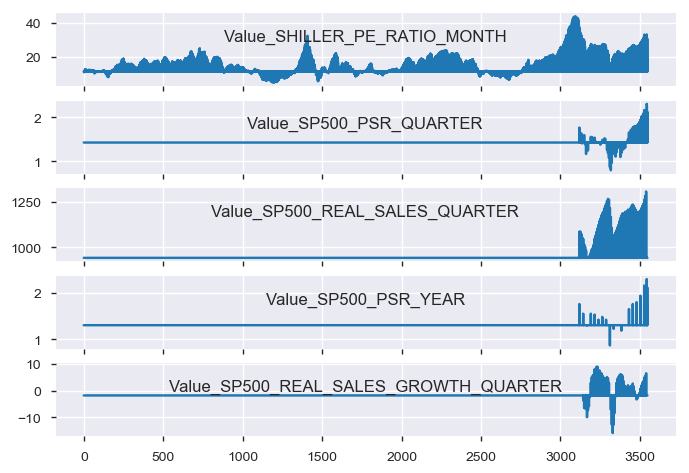

<Figure size 3000x2000 with 0 Axes>

['Value_SHILLER_PE_RATIO_MONTH',
 'Value_SP500_PSR_QUARTER',
 'Value_SP500_REAL_SALES_QUARTER',
 'Value_SP500_PSR_YEAR',
 'Value_SP500_REAL_SALES_GROWTH_QUARTER']

In [51]:
#print chart with top 5 features with lowest variance
Print_PCAfeatures_graph(df_imputed,a,5)

[(-0.3099270964617886, 'Value_SP500_DIV_GROWTH_YEAR'),
 (-0.30472102931433814, 'Value_SP500_DIV_YEAR'),
 (-0.24703832789002747, 'Value_SP500_REAL_SALES_GROWTH_QUARTER'),
 (-0.23874586737089795, 'Value_SP500_SALES_YEAR'),
 (-0.2383254455928687, 'Value_SP500_SALES_QUARTER'),
 (-0.22862267710171758, 'Value_SP500_SALES_GROWTH_QUARTER'),
 (-0.2276975766969936, 'Value_SP500_EARNINGS_GROWTH_QUARTER'),
 (-0.2205363310620414, 'Value_SP500_REAL_EARNINGS_GROWTH_YEAR'),
 (-0.18570532863264552, 'Value_SHILLER_PE_RATIO_MONTH'),
 (-0.18030144089471137, 'Value_SP500_PSR_YEAR'),
 (-0.14675080518992814, 'Value_SP500_SALES_GROWTH_YEAR'),
 (-0.14261472452590546, 'Value_SP500_INFLADJ_YEAR'),
 (-0.13310173004335377, 'Value_SP500_PE_RATIO_YEAR'),
 (-0.13165915021671745, 'Value_SP500_REAL_PRICE_MONTH'),
 (-0.1275332154522852, 'Value_SP500_INFLADJ_MONTH'),
 (-0.11806250612104319, 'Value_SP500_EARNINGS_GROWTH_YEAR'),
 (-0.1177629782635305, 'Value_SP500_EARNINGS_MONTH'),
 (-0.11682443659890858, 'Value_SP500_DIV_

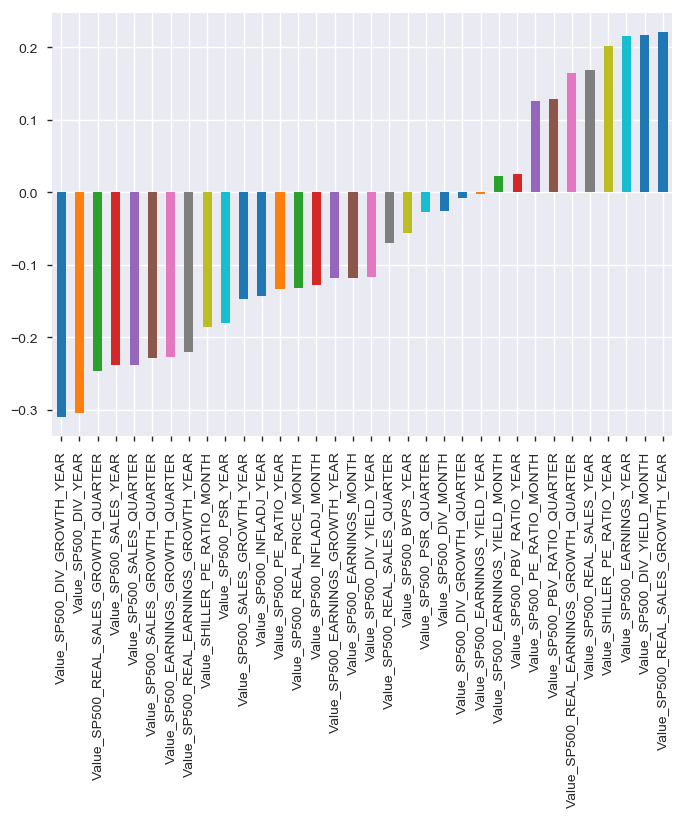

In [52]:
b = sorted_weights(pca_interpolated,1,df_scaled_features_interpolation)
b

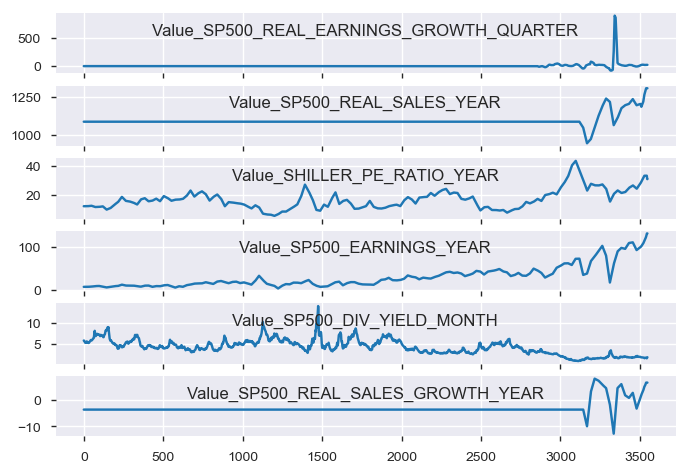

<Figure size 3000x2000 with 0 Axes>

['Value_SP500_REAL_EARNINGS_GROWTH_QUARTER',
 'Value_SP500_REAL_SALES_YEAR',
 'Value_SHILLER_PE_RATIO_YEAR',
 'Value_SP500_EARNINGS_YEAR',
 'Value_SP500_DIV_YIELD_MONTH',
 'Value_SP500_REAL_SALES_GROWTH_YEAR']

In [53]:
#print chart with top 5 features with maximum variance
Print_PCAfeatures_graph(df_interpolate,b,-6)

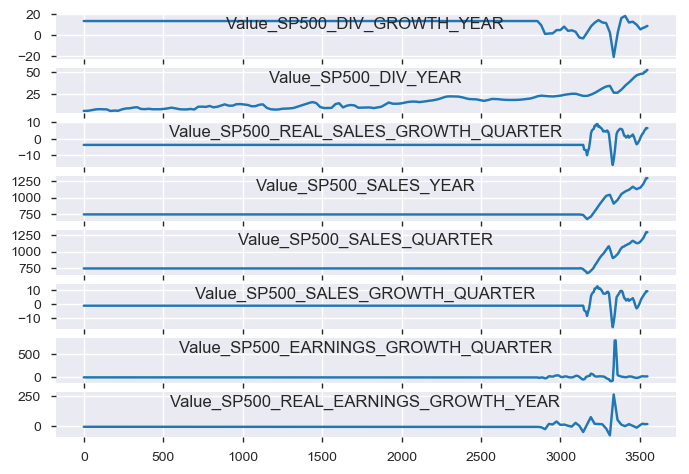

<Figure size 3000x2000 with 0 Axes>

['Value_SP500_DIV_GROWTH_YEAR',
 'Value_SP500_DIV_YEAR',
 'Value_SP500_REAL_SALES_GROWTH_QUARTER',
 'Value_SP500_SALES_YEAR',
 'Value_SP500_SALES_QUARTER',
 'Value_SP500_SALES_GROWTH_QUARTER',
 'Value_SP500_EARNINGS_GROWTH_QUARTER',
 'Value_SP500_REAL_EARNINGS_GROWTH_YEAR']

In [54]:
Print_PCAfeatures_graph(df_interpolate,b,8)

# Split dataset into Train and Test set.

    Split 80% of dataset into train and 20% into test based on chronological order because its a timeseries. Avoid look-ahead bias by doing this.

In [55]:
def Create_Training_Test_Dataset(df,split_percent,Linear_regr):
    '''
    This function would split, slice and create training and test datasets. Provide 'Value_SP500_REAL_PRICE_MONTH' in the input 
    df. It would input to X
    
    IN- df- a dataframe from which training and test dataset needs to slice.
    split_percent - split percent for training and test dataset.
    Linear_regr - A flag to split between dataset for linear regression object or LSTM network. Works for this project only.
    
    OUT- X_train, Y_train, X_test, Y_test
    
    '''
       
    # Split the size into 80% and 20% based on rows.
    train_size = int(len(df) * split_percent)
    test_size = len(df) - train_size
    #print(train_size,test_size)
    print('Training and Test dataset is of size {} & {}'.format(train_size,test_size))
    
    #Slice the df into train and test df.
    train = df.iloc[0:train_size,:]
    test = df.iloc[train_size:len(df),:]
    #print(train.shape, test.shape)
    
    #Check for Linear Regression flag from user input. If false it would return dataset for LSTM neural network.
    if Linear_regr == 'False':
        #Create Training dataset
        temp_train = train.drop(['Value_SP500_REAL_PRICE_MONTH'],axis=1,inplace=False)
        X_train = temp_train.iloc[0:train_size,:]
        #X_train.head()
        Y_train = train.iloc[0:train_size,:1]
        #print(Y_train.head())
        #print(X_train.shape,Y_train.shape)
        #print(X_train.columns,Y_train.columns)
        print('Features size of X_train and training target Y_train shape is {} & {}'.format(X_train.shape,Y_train.shape))

        #Define Test dataset
        temp_test = test.drop(['Value_SP500_REAL_PRICE_MONTH'],axis=1,inplace=False)
        X_test = temp_test.iloc[0:test_size,:]
        #X_train.head()
        Y_test = test.iloc[0:test_size,:1]
        #print(Y_train.head())
        #print(X_test.shape,Y_test.shape)
        #print(X_test.columns,Y_test.columns)
        print('Features size of X_test and Test target Y_test shape is {} & {}'.format(X_test.shape,Y_test.shape))
        
    else:
        #Train dataset
        X_train = train['Value_SP500_REAL_PRICE_MONTH'][0:train_size]
        Y_train = train['Value_SP500_REAL_PRICE_MONTH'][0:test_size]
        print('Features size of X_train and training target Y_train shape is {} & {}'.format(X_train.shape,Y_train.shape))
            
        #Test dataset
        X_test = test['Value_SP500_REAL_PRICE_MONTH'][0:train_size]
        Y_test = test['Value_SP500_REAL_PRICE_MONTH'][0:test_size]
        print('Features size of X_test and Test target Y_test shape is {} & {}'.format(X_test.shape,Y_test.shape))
        

    return X_train, Y_train, X_test, Y_test
    
def Convert_dataset_nparray(X_train, Y_train, X_test, Y_test):
    '''
    This function would convert the training and test dataset to np.array.
    In- X_train, Y_train, X_test, Y_test
    
    OUT- np.array of X_train, Y_train, X_test, Y_test
    
    '''
    #Convert to np array as required for LSTM model.
    X_train = np.array(X_train)
    Y_train = np.array(Y_train)
    #print(X_train.shape,Y_train.shape)
    print('Training dataset is converted to np.array with size {} & {}'.format(X_train.shape,Y_train.shape))

    #Convert test dataset to np.array.
    X_test = np.array(X_test)
    Y_test = np.array(Y_test)
    #print(X_test.shape,Y_test.shape)
    print('Test dataset is converted to np.array with size {} & {}'.format(X_test.shape,Y_test.shape))
    
    return X_train, Y_train, X_test, Y_test

# Define and Fit LSTM model in keras

    Multivariate time-series prediction

In [56]:
from subprocess import check_output
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.layers.embeddings import Embedding
from keras.models import Sequential
from keras.layers import LSTM, CuDNNLSTM , BatchNormalization
import tensorflow as tf
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint


import time
from numpy import newaxis

Using TensorFlow backend.


In [57]:
# #Build Model
# model = Sequential()

# model.add(LSTM(input_dim=1,output_dim=50,return_sequences=True))
# model.add(Dropout(0.2))

# model.add(LSTM(100,return_sequences=False))
# model.add(Dropout(0.2))

# model.add(Dense(output_dim=1))
# model.add(Activation('linear'))

# start = time.time()
# model.compile(loss='mse', optimizer='rmsprop')
# print ('compilation time : ', time.time() - start)

In [58]:
# #Build the model
# model = Sequential()
# model.add(LSTM(256,input_shape=(2837,34)))
# model.add(Dense(1))
# model.compile(optimizer='adam',loss='mse')
# #Reshape data for (Sample,Timestep,Features) 
# #X_train = X_train.reshape((X_train.shape[0],X_train.shape[1],1))
# #X_test = X_test.reshape((X_test.shape[0],X_test.shape[1],1))
# #Fit model with history to check for overfitting
# #history = model.fit(X_train,y_train,epochs=300,validation_data=(X_test,y_test),shuffle=False)

In [59]:
#model.fit(X_train,Y_train,batch_size=128,epochs=10,validation_split=0.05)

In [60]:
# model = Sequential([
#     Dense(32, input_shape=(2837,34)),
#     Activation('relu'),
#     Dense(10),
#     Activation('softmax'),
# ])

# #Compile
# # For a mean squared error regression problem
# model.compile(optimizer='rmsprop',
#               loss='mse')

In [61]:
df_interpolate.columns

Index(['Value_SP500_REAL_PRICE_MONTH', 'Value_SP500_DIV_YIELD_MONTH',
       'Value_SP500_PE_RATIO_MONTH', 'Value_SHILLER_PE_RATIO_MONTH',
       'Value_SP500_EARNINGS_YIELD_MONTH', 'Value_SP500_INFLADJ_MONTH',
       'Value_SP500_PSR_QUARTER', 'Value_SP500_DIV_MONTH',
       'Value_SP500_DIV_YEAR', 'Value_SP500_DIV_GROWTH_YEAR',
       'Value_SP500_DIV_GROWTH_QUARTER', 'Value_SP500_PBV_RATIO_QUARTER',
       'Value_SHILLER_PE_RATIO_YEAR', 'Value_SP500_PE_RATIO_YEAR',
       'Value_SP500_DIV_YIELD_YEAR', 'Value_SP500_PSR_YEAR',
       'Value_SP500_EARNINGS_YIELD_YEAR', 'Value_SP500_PBV_RATIO_YEAR',
       'Value_SP500_INFLADJ_YEAR', 'Value_SP500_SALES_YEAR',
       'Value_SP500_SALES_GROWTH_YEAR', 'Value_SP500_SALES_QUARTER',
       'Value_SP500_REAL_SALES_GROWTH_QUARTER',
       'Value_SP500_SALES_GROWTH_QUARTER',
       'Value_SP500_REAL_SALES_GROWTH_YEAR',
       'Value_SP500_REAL_EARNINGS_GROWTH_YEAR', 'Value_SP500_REAL_SALES_YEAR',
       'Value_SP500_REAL_EARNINGS_GROWTH_QUARTER'

In [62]:
#Not using PCA features here because the model resulted in huge mse errors. I think monthly features should be used which could 
#predict the real price correctly.
df_PCA_features = df_interpolate.loc[:,['Value_SP500_REAL_PRICE_MONTH',
                                        'Value_SP500_DIV_YIELD_MONTH',
                                        'Value_SP500_PE_RATIO_MONTH',
                                        'Value_SHILLER_PE_RATIO_MONTH',
                                        'Value_SP500_EARNINGS_YIELD_MONTH',
                                        'Value_SP500_INFLADJ_MONTH',
                                        'Value_SP500_EARNINGS_MONTH','Value_SP500_PSR_QUARTER','Value_SP500_SALES_QUARTER',
                                       'Value_SP500_REAL_SALES_GROWTH_QUARTER','Value_SP500_REAL_EARNINGS_GROWTH_QUARTER']]

df_PCA_features.shape

(3548, 11)

In [63]:
#apply scaling
scaler_df_imputed = StandardScaler()
scaled_features = scaler_df_imputed.fit_transform(df_PCA_features.values)
df_scaled_features_interpol = pd.DataFrame(scaled_features,index=df_PCA_features.index,columns = df_PCA_features.columns)
#df_scaled_features.describe()

In [64]:
#Use real data
#X_train, Y_train, X_test, Y_test = Create_Training_Test_Dataset(df=df_PCA_features, split_percent=0.95, Linear_regr='False')
#X_train, Y_train, X_test, Y_test = Convert_dataset_nparray(X_train, Y_train, X_test, Y_test)

In [65]:
#Split master dataframe into training and test datasets
X_train, Y_train, X_test, Y_test = Create_Training_Test_Dataset(df=df_PCA_features, split_percent=0.98, Linear_regr='False')

X_train, Y_train, X_test, Y_test = Convert_dataset_nparray(X_train, Y_train, X_test, Y_test)

Training and Test dataset is of size 3477 & 71
Features size of X_train and training target Y_train shape is (3477, 10) & (3477, 1)
Features size of X_test and Test target Y_test shape is (71, 10) & (71, 1)
Training dataset is converted to np.array with size (3477, 10) & (3477, 1)
Test dataset is converted to np.array with size (71, 10) & (71, 1)


In [66]:
#Shape training data.
#the inputs (X) are reshaped into the 3D format expected by LSTM, namely [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0],1,10))
#Y_train = Y_train.reshape((Y_train.shape[0],1,1)) #Do not reshape it. 
print(X_train.shape,Y_train.shape)
print(X_train.shape[1],X_train.shape[2])

#Shape test dataset correctly for LSTM predict.
X_test = X_test.reshape((X_test.shape[0],1,10))
#Y_test = Y_test.reshape((Y_test.shape[0],Y_test.shape[1],1))
print(X_test.shape,Y_test.shape)
print('X_test input shape : ', X_test.shape[0],X_test.shape[1],X_test.shape[2])

(3477, 1, 10) (3477, 1)
1 10
(71, 1, 10) (71, 1)
X_test input shape :  71 1 10


In [67]:
# #Design network for mean squared error regression problem
# model = Sequential()
# model.add(LSTM(512, input_shape=(X_train.shape[1], X_train.shape[2])))
# model.add(Dropout(0.2))
# Activation('relu')
# model.add(Dense(1))
# Activation('softmax')

# # Compiling the model using mean square error loss, and Adam optimizer.
# model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])
# #model.compile(loss='mse',optimizer='rmsprop',metrics=['accuracy'])

In [68]:
# max_features = 1024

# model = Sequential()
# model.add(Embedding(max_features, output_dim=256))
# model.add(LSTM(128))
# model.add(Dropout(0.5))
# model.add(Dense(1, activation='sigmoid'))

# model.compile(loss='binary_crossentropy',
#               optimizer='rmsprop',
#               metrics=['accuracy'])

In [69]:
#Design network for mean squared error regression problem
model = Sequential()
#The first dimension is supposed to be each sample.input should be (n_samples, timesteps, n_features)
model.add(LSTM(512, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(BatchNormalization())

# model.add(LSTM(512, input_shape=(X_train.shape[0],X_train.shape[2]),return_sequences=True))
# model.add(Dropout(0.1))
# model.add(BatchNormalization())

Activation('relu')
model.add(Dense(1))

Activation('softmax')

# Compiling the model using mean square error loss, and Adam optimizer.
model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])
#model.compile(loss='mse',optimizer='rmsprop',metrics=['accuracy'])
filepath = "RNN_final-{epoch:02d}-{val_acc:.3f}"#unique file name which will include epochs and validation accuracy score.
checkpoint = ModelCheckpoint("models/{}.model".format(filepath,monitor = 'val_acc',verbose = 1))

print(model.summary)

<bound method Network.summary of <keras.engine.sequential.Sequential object at 0x0000023B40B28C88>>


In [70]:
# fit network with epochs
history = model.fit(X_train, Y_train, epochs=200, batch_size=100, validation_data=(X_train, Y_train), verbose=2,
                    callbacks = [checkpoint],
                    shuffle=False)

model.save('LSTM_model',overwrite=True,include_optimizer=True)

Train on 3477 samples, validate on 3477 samples
Epoch 1/200
 - 5s - loss: 244238.9797 - acc: 0.0000e+00 - val_loss: 242630.7920 - val_acc: 0.0000e+00
Epoch 2/200
 - 2s - loss: 243637.9757 - acc: 0.0000e+00 - val_loss: 242623.0742 - val_acc: 0.0000e+00
Epoch 3/200
 - 2s - loss: 242933.8914 - acc: 2.8760e-04 - val_loss: 242195.8168 - val_acc: 0.0000e+00
Epoch 4/200
 - 2s - loss: 242000.9474 - acc: 2.8760e-04 - val_loss: 241721.6815 - val_acc: 0.0000e+00
Epoch 5/200
 - 2s - loss: 240848.0547 - acc: 0.0000e+00 - val_loss: 240140.1107 - val_acc: 2.8760e-04
Epoch 6/200
 - 2s - loss: 239475.0473 - acc: 0.0000e+00 - val_loss: 240018.5771 - val_acc: 0.0000e+00
Epoch 7/200
 - 2s - loss: 237921.6260 - acc: 0.0000e+00 - val_loss: 239362.4484 - val_acc: 2.8760e-04
Epoch 8/200
 - 2s - loss: 236189.1215 - acc: 2.8760e-04 - val_loss: 238873.2472 - val_acc: 0.0000e+00
Epoch 9/200
 - 2s - loss: 234283.8113 - acc: 0.0000e+00 - val_loss: 236238.2314 - val_acc: 0.0000e+00
Epoch 10/200
 - 2s - loss: 232263.

Epoch 81/200
 - 3s - loss: 195431.5948 - acc: 0.0000e+00 - val_loss: 185281.1637 - val_acc: 0.0000e+00
Epoch 82/200
 - 3s - loss: 195427.2975 - acc: 0.0000e+00 - val_loss: 185063.8881 - val_acc: 0.0000e+00
Epoch 83/200
 - 2s - loss: 195429.2891 - acc: 0.0000e+00 - val_loss: 185142.5852 - val_acc: 0.0000e+00
Epoch 84/200
 - 2s - loss: 195459.0527 - acc: 0.0000e+00 - val_loss: 184590.9984 - val_acc: 0.0000e+00
Epoch 85/200
 - 2s - loss: 195448.4422 - acc: 0.0000e+00 - val_loss: 184182.4285 - val_acc: 0.0000e+00
Epoch 86/200
 - 2s - loss: 195424.7728 - acc: 0.0000e+00 - val_loss: 184104.9516 - val_acc: 0.0000e+00
Epoch 87/200
 - 2s - loss: 195400.6353 - acc: 0.0000e+00 - val_loss: 183871.4632 - val_acc: 0.0000e+00
Epoch 88/200
 - 3s - loss: 195432.5526 - acc: 0.0000e+00 - val_loss: 183814.1315 - val_acc: 0.0000e+00
Epoch 89/200
 - 3s - loss: 195453.0358 - acc: 2.8760e-04 - val_loss: 184666.0870 - val_acc: 0.0000e+00
Epoch 90/200
 - 2s - loss: 195464.1884 - acc: 0.0000e+00 - val_loss: 1844

Epoch 160/200
 - 3s - loss: 195506.8130 - acc: 0.0000e+00 - val_loss: 182244.1800 - val_acc: 0.0000e+00
Epoch 161/200
 - 3s - loss: 195480.0568 - acc: 0.0000e+00 - val_loss: 182473.5691 - val_acc: 0.0000e+00
Epoch 162/200
 - 2s - loss: 195496.4917 - acc: 0.0000e+00 - val_loss: 182636.2321 - val_acc: 0.0000e+00
Epoch 163/200
 - 2s - loss: 195471.3256 - acc: 0.0000e+00 - val_loss: 182680.6537 - val_acc: 2.8760e-04
Epoch 164/200
 - 2s - loss: 195473.1113 - acc: 0.0000e+00 - val_loss: 182696.0740 - val_acc: 0.0000e+00
Epoch 165/200
 - 2s - loss: 195477.8964 - acc: 0.0000e+00 - val_loss: 182575.0914 - val_acc: 2.8760e-04
Epoch 166/200
 - 2s - loss: 195487.1710 - acc: 0.0000e+00 - val_loss: 182742.1346 - val_acc: 0.0000e+00
Epoch 167/200
 - 2s - loss: 195460.1076 - acc: 0.0000e+00 - val_loss: 182596.5257 - val_acc: 0.0000e+00
Epoch 168/200
 - 3s - loss: 195465.9434 - acc: 0.0000e+00 - val_loss: 182656.0113 - val_acc: 0.0000e+00
Epoch 169/200
 - 2s - loss: 195463.6720 - acc: 2.8760e-04 - val_

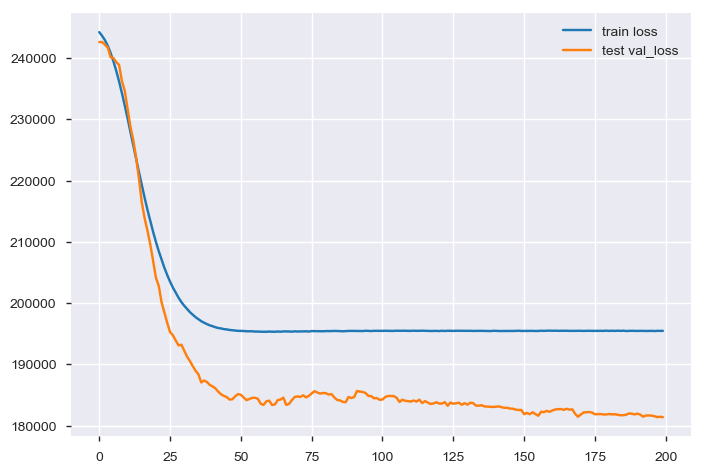

In [71]:
# plot history
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='test val_loss')
plt.legend()
plt.show()

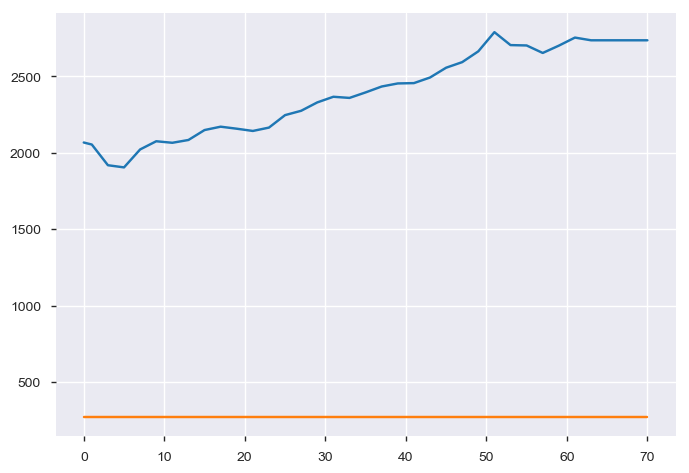

In [72]:
y_pred_lstm_imputed = model.predict(X_test)
plt.plot(Y_test.reshape(-1,1))
plt.plot(y_pred_lstm_imputed)

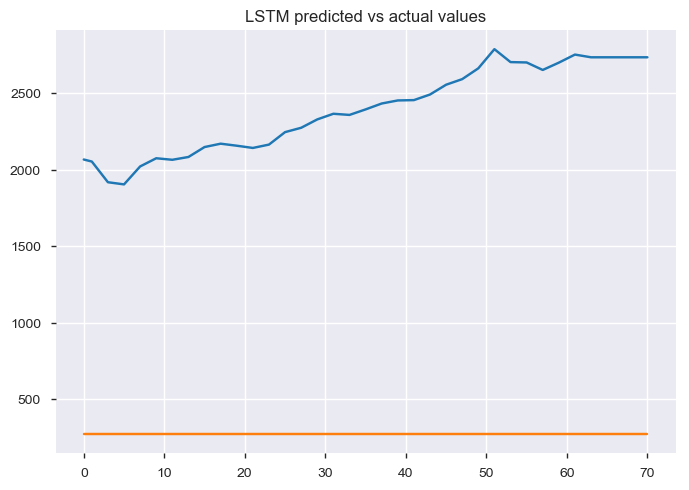

In [73]:
plt.plot(Y_test.reshape(-1,1))
plt.plot(y_pred_lstm_imputed)

plt.title('LSTM predicted vs actual values')
#plt.xlabel('Actual Price')
#plt.ylabel('Predicted Price')
#plt.legend(Y_test,y_pred_lstm_imputed)
plt.show()


In [74]:
print(Y_test.shape,X_test.shape,y_pred_lstm_imputed.shape)

(71, 1) (71, 1, 10) (71, 1)


Check and updated shape of X_test. Scale X_train and x_test on correct shape of dataframe.

In [75]:
#Inverse transform the prediction and Y_test
X_test = X_test.reshape((X_test.shape[0],X_test.shape[2]))

# Concatenate with X_test to reshape before inverse transform
y_pred_lstm_imputed = concatenate((y_pred_lstm_imputed,X_test),axis=1)
print(X_test.shape,y_pred_lstm_imputed.shape,Y_test.shape)

#Invert scaling for forecast
y_pred_lstm_imputed = scaler_df_imputed.inverse_transform(y_pred_lstm_imputed)
print(X_test.shape,y_pred_lstm_imputed.shape,Y_test.shape)

#slice reverse transformed y_pred values to compare with Y_test actual values
y_pred_lstm_imputed = y_pred_lstm_imputed[:,0:1]


(71, 10) (71, 11) (71, 1)
(71, 10) (71, 11) (71, 1)


In [76]:
#Reconsturct Y_test with X_test and inverse transform it.
Y_test = concatenate((Y_test,X_test),axis=1)
Y_test = scaler_df_imputed.inverse_transform(Y_test)
#slice reverse transformed y_pred values to compare with Y_test actual values
Y_test = Y_test[:,0:1]

In [77]:
print(X_test.shape,y_pred_lstm_imputed.shape,Y_test.shape)

(71, 10) (71, 1) (71, 1)


# Evaluate Model LSTM model

In [78]:
#Calculate MSE between actual values Y_test and inverse transformed y_pred
mse = mean_squared_error(Y_test,y_pred_lstm_imputed)
print('Means Square Error between Y_test adn prediction values is :', mse)

Means Square Error between Y_test adn prediction values is : 1307257985747.0803


In [79]:
print('predicted- {} ; Actual - {}'.format(y_pred_lstm_imputed[-1], Y_test[-1]))

predicted- [143851.07772796] ; Actual - [1460579.96104185]


In [80]:
r2score = r2_score(Y_test,y_pred_lstm_imputed)
print('R2 score between Y_test adn prediction value is :', r2score)

R2 score between Y_test adn prediction value is : -60.31341629150638


In [81]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 512)               1071104   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 512)               2048      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 513       
Total params: 1,073,665
Trainable params: 1,072,641
Non-trainable params: 1,024
_________________________________________________________________


# Apply Linear Regression model

In [82]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

In [83]:
#Convert Date index to column
#df_imputed.reset_index(inplace=True)

# Plotting the Least Squares Line
Best observed high variance features Vs target label 'Value_SP500_REAL_PRICE_MONTH' to understand linear corelation.

    This is to find colinearity between features and the prediction line for selected set of features. Predicted line would try to fit with linear regression model through the feature data points.
    
    The dataset here is very imbalanced and non linear which makes it different to predict a linear line with optimum coefficients and intercept.

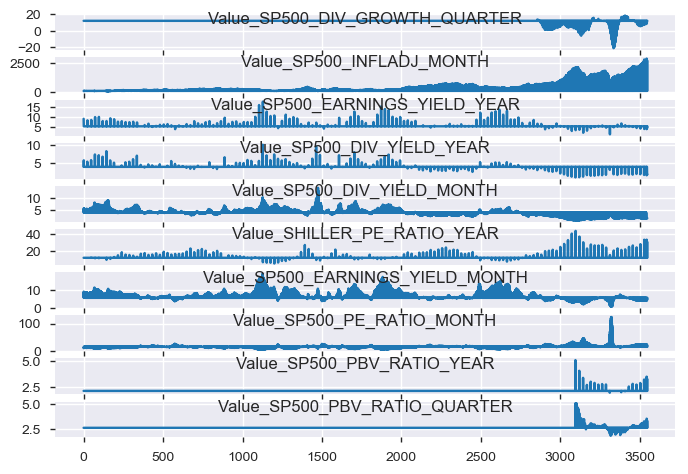

<Figure size 3000x2000 with 0 Axes>

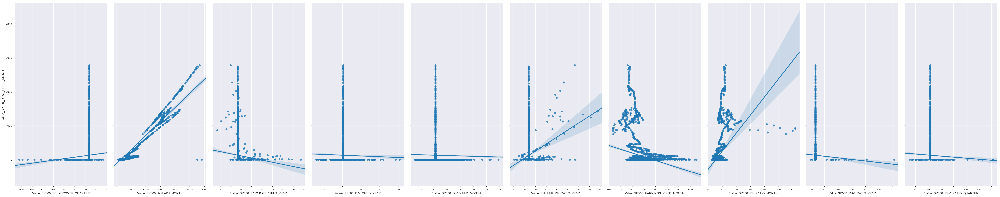

In [84]:
 #5 features with highest variance.
max_var_cols1 = Print_PCAfeatures_graph(df_imputed,a,-10)

# visualize relationship between the features and the target price using scatterplots
sns.pairplot(df_imputed, x_vars=max_var_cols1,y_vars=['Value_SP500_REAL_PRICE_MONTH'], height=10, aspect=0.5,kind='reg')

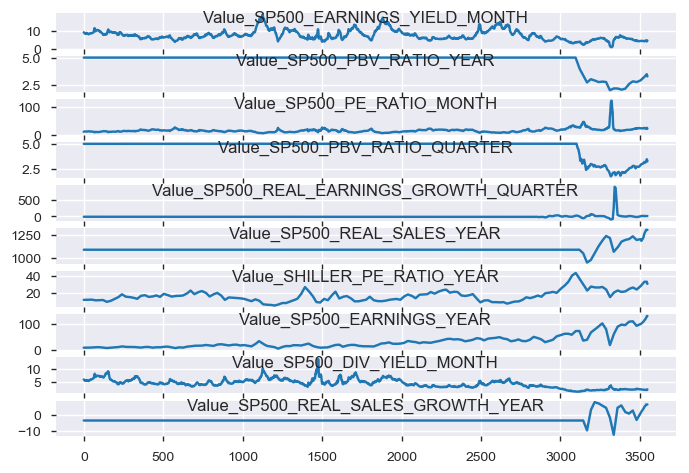

<Figure size 3000x2000 with 0 Axes>

['Value_SP500_EARNINGS_YIELD_MONTH', 'Value_SP500_PBV_RATIO_YEAR', 'Value_SP500_PE_RATIO_MONTH', 'Value_SP500_PBV_RATIO_QUARTER', 'Value_SP500_REAL_EARNINGS_GROWTH_QUARTER', 'Value_SP500_REAL_SALES_YEAR', 'Value_SHILLER_PE_RATIO_YEAR', 'Value_SP500_EARNINGS_YEAR', 'Value_SP500_DIV_YIELD_MONTH', 'Value_SP500_REAL_SALES_GROWTH_YEAR']


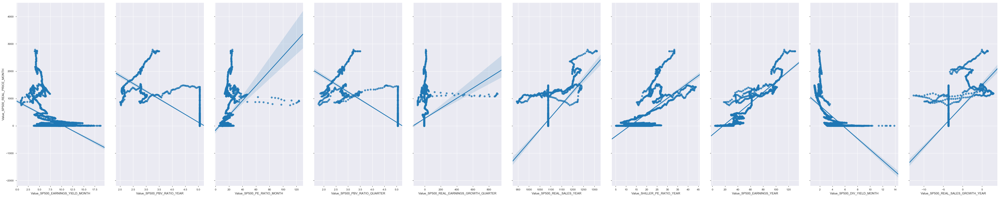

In [85]:
 #5 feature with highest PCA variance.
max_var_cols2 = Print_PCAfeatures_graph(df_interpolate,b,-10)
print(max_var_cols2)

# visualize relationship between the features and the target price using seaborn scatterplot. 
#High variance features Vs target label
sns.pairplot(df_interpolate, x_vars=max_var_cols2,y_vars=['Value_SP500_REAL_PRICE_MONTH'], height=10, aspect=0.5,kind='reg')

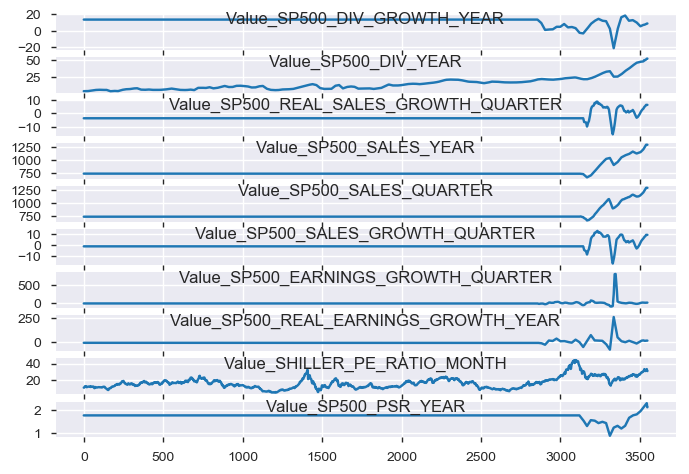

<Figure size 3000x2000 with 0 Axes>

['Value_SP500_DIV_GROWTH_YEAR', 'Value_SP500_DIV_YEAR', 'Value_SP500_REAL_SALES_GROWTH_QUARTER', 'Value_SP500_SALES_YEAR', 'Value_SP500_SALES_QUARTER', 'Value_SP500_SALES_GROWTH_QUARTER', 'Value_SP500_EARNINGS_GROWTH_QUARTER', 'Value_SP500_REAL_EARNINGS_GROWTH_YEAR', 'Value_SHILLER_PE_RATIO_MONTH', 'Value_SP500_PSR_YEAR']


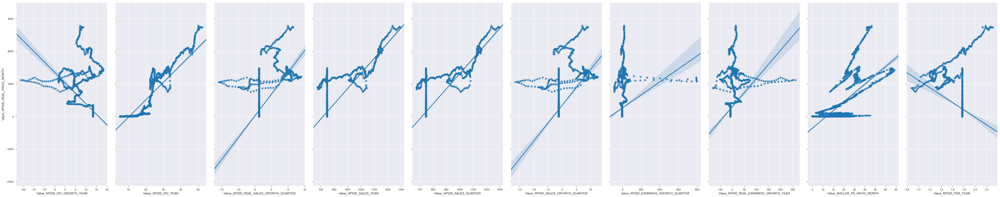

In [86]:
 #5 feature with highest PCA variance.
max_var_cols3 = Print_PCAfeatures_graph(df_interpolate,b,10)
print(max_var_cols3)

# visualize relationship between the features and the target price using seaborn scatterplot. 
#High variance features Vs target label
sns.pairplot(df_interpolate, x_vars=max_var_cols3,y_vars=['Value_SP500_REAL_PRICE_MONTH'], height=10, aspect=0.5,kind='reg')

# Split into training and test dataset for Linear Regression

In [87]:
#Split data into train and test
#X_train, Y_train, X_test, Y_test = Create_Training_Test_Dataset(df_imputed,0.8,Linear_regr='True')

In [88]:
scaler = StandardScaler()
scaled_interpolated = scaler.fit_transform(df_PCA_features.values)
df_scaled_interpolated = pd.DataFrame(scaled_interpolated,index=df_PCA_features.index,columns = df_PCA_features.columns)

In [89]:
# Split the size into 80% and 20% row-wise
split_percent = 0.8
train_size = int(len(df_PCA_features) * split_percent)
test_size = len(df_PCA_features) - train_size
#print(train_size,test_size)
print('Training and Test dataset is of size {} & {}'.format(train_size,test_size))

#Slice the df into train and test df.
train = df_PCA_features.iloc[0:train_size,:]
test = df_PCA_features.iloc[train_size:len(df),:]
print(train.shape, test.shape)

Training and Test dataset is of size 2838 & 710
(2838, 11) (710, 11)


In [90]:
# #Slice the df into train and test df.
# train = df_scaled_interpolated.iloc[0:train_size,:]
# test = df_scaled_interpolated.iloc[train_size:len(df),:]
# print(train.shape, test.shape)

In [91]:
# Slice Train dataset.
temp_train = train.drop(['Value_SP500_REAL_PRICE_MONTH'],axis=1,inplace=False)
X_train = train.drop(['Value_SP500_REAL_PRICE_MONTH'],axis=1,inplace=False)
Y_train = train['Value_SP500_REAL_PRICE_MONTH']
print('Features size of X_train and training target Y_train shape is {} & {}'.format(X_train.shape,Y_train.shape))

#Test dataset
X_test = test.drop(['Value_SP500_REAL_PRICE_MONTH'],axis=1,inplace=False)
Y_test = test['Value_SP500_REAL_PRICE_MONTH']
print('Features size of X_test and Test target Y_test shape is {} & {}'.format(X_test.shape,Y_test.shape))

Features size of X_train and training target Y_train shape is (2838, 10) & (2838,)
Features size of X_test and Test target Y_test shape is (710, 10) & (710,)


In [92]:
#np.array(temp_train[:]).reshape(-1,1)
#print((np.array(temp_train[:]).reshape(-1,2)).shape)

# Instantiate linear regression model from scikit-learn

In [93]:
# Instantiate linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train, Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

# Interpreting model coefficients

In [94]:
# print the intercept and coefficients
print(regr.intercept_)
print(regr.coef_)

137.11463021015638
[-3.89875853e+00 -5.67269650e-01 -5.46924799e+00 -6.41997252e+00
  1.29380410e-01  2.46530686e+00  0.00000000e+00 -3.98730436e-02
  1.55754077e-04  1.55754077e-04]


# Making Predictions

In [95]:
#Linear regression prediction on testing set
y_pred_inter_regr = regr.predict(X_test)

In [96]:
print(y_pred_inter_regr.shape,X_test.shape,Y_test.shape)

(710,) (710, 10) (710,)


# Evaluate

# Model evaluation metrics for linear regression

In [97]:
feature_cols = X_train.columns
# pair the feature names with the coefficients
print('Coefficients of all feature variables in training dataset are: ')
list(zip(feature_cols, regr.coef_))

Coefficients of all feature variables in training dataset are: 


[('Value_SP500_DIV_YIELD_MONTH', -3.8987585275669585),
 ('Value_SP500_PE_RATIO_MONTH', -0.5672696500428746),
 ('Value_SHILLER_PE_RATIO_MONTH', -5.469247991877379),
 ('Value_SP500_EARNINGS_YIELD_MONTH', -6.41997252365831),
 ('Value_SP500_INFLADJ_MONTH', 0.12938040986247704),
 ('Value_SP500_EARNINGS_MONTH', 2.465306856497017),
 ('Value_SP500_PSR_QUARTER', 0.0),
 ('Value_SP500_SALES_QUARTER', -0.03987304360362631),
 ('Value_SP500_REAL_SALES_GROWTH_QUARTER', 0.00015575407657666528),
 ('Value_SP500_REAL_EARNINGS_GROWTH_QUARTER', 0.00015575407657666528)]

In [98]:
# The coefficients
#print('Coefficients: \n', regr.coef_)

# The mean squared error:  is always non-negative, and values closer to zero are better.
print('Mean squared error: {}'.format(mean_squared_error(Y_test, y_pred_inter_regr)))

# The Root mean squared error: RMSE is popular than MSE, because RMSE is interpretable in the "y" units.
print('Root Mean squared error: {}'.format(np.sqrt(mean_squared_error(Y_test, y_pred_inter_regr))))

# Explained variance score: 1 is perfect prediction
print('Variance R2 score: {}'.format(r2_score(Y_test, y_pred_inter_regr)))
print('intercept: ',regr.intercept_)
print('Score : ',regr.score)

Mean squared error: 1076172.6990871658
Root Mean squared error: 1037.3874392372243
Variance R2 score: -1.9382920775190278
intercept:  137.11463021015638
Score :  <bound method RegressorMixin.score of LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)>


In [99]:
#Reshape prediction and test set to concatenate with X_test to get origninal form of test dataset.
y_pred_inter_regr = y_pred_inter_regr[:,np.newaxis]
Y_test = Y_test[:,np.newaxis]
print(X_train.shape,X_test.shape,y_pred_inter_regr.shape,Y_test.shape)
y_pred_inter_regr = concatenate((y_pred_inter_regr, X_test), axis=1)
print(X_test.shape,y_pred_inter_regr.shape,Y_test.shape)

(2838, 10) (710, 10) (710, 1) (710, 1)
(710, 10) (710, 11) (710, 1)


In [100]:
# # Plot outputs
# for col in feature_cols:
#     plt.scatter(X_test[col], Y_test)
#     #plt.plot(X_test[col], y_pred_imputed_regr)
#     #print(col)

# plt.xticks(())
# plt.yticks(())
# plt.show()

In [101]:
feature_cols = X_train.columns
# pair the feature names with the coefficients
print('Coefficients of all feature variables in training dataset are: ')
list(zip(feature_cols, regr.coef_))

Coefficients of all feature variables in training dataset are: 


[('Value_SP500_DIV_YIELD_MONTH', -3.8987585275669585),
 ('Value_SP500_PE_RATIO_MONTH', -0.5672696500428746),
 ('Value_SHILLER_PE_RATIO_MONTH', -5.469247991877379),
 ('Value_SP500_EARNINGS_YIELD_MONTH', -6.41997252365831),
 ('Value_SP500_INFLADJ_MONTH', 0.12938040986247704),
 ('Value_SP500_EARNINGS_MONTH', 2.465306856497017),
 ('Value_SP500_PSR_QUARTER', 0.0),
 ('Value_SP500_SALES_QUARTER', -0.03987304360362631),
 ('Value_SP500_REAL_SALES_GROWTH_QUARTER', 0.00015575407657666528),
 ('Value_SP500_REAL_EARNINGS_GROWTH_QUARTER', 0.00015575407657666528)]

MSE, RMSE and R2 score are very bad with all features and PCA selected features.

# Prediction using fbProphet

https://research.fb.com/prophet-forecasting-at-scale/

https://facebook.github.io/prophet/docs/quick_start.html#python-api

In [105]:
from fbprophet import Prophet
# plt.style.available
plt.style.use("seaborn-whitegrid")
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import statsmodels.api as sm
from scipy import stats

In [106]:
#Reset index of df to make it a column as prerequisite for fbProphet.
df_fb = df_imputed.reset_index()
df_interpolate_fb = df_interpolate.reset_index()
df_interpolate_fb.tail() #for further use.

#Change dtype of Date column to datetime64 for fbProphet
df_interpolate_fb.loc[:,'Date'] = pd.to_datetime(df_interpolate_fb.loc[:,'Date'],format = '%Y%m%d')

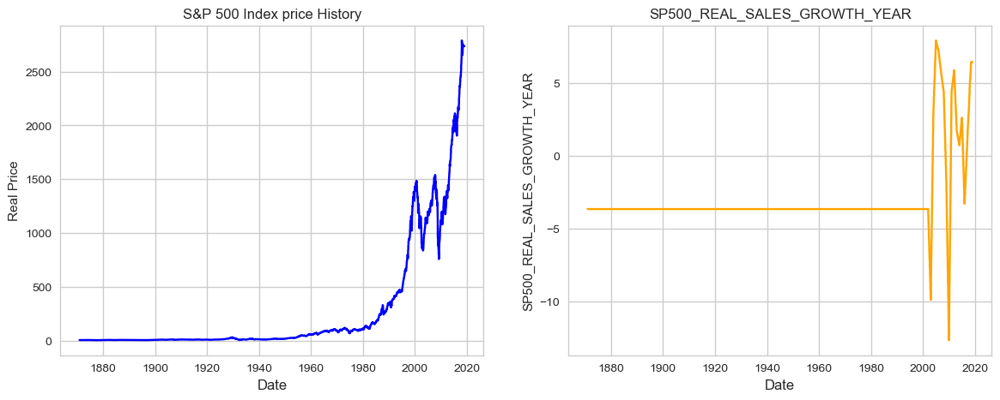

In [107]:
#Plotting of S&P interpolated price vs date 
# First Subplot
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,5))
ax1.plot(df_interpolate_fb['Date'], df_interpolate_fb['Value_SP500_REAL_PRICE_MONTH'],color ='blue')
#ax1.plot(df_fb['Date'], df_fb['Value_SP500_REAL_PRICE_MONTH'],color='red')
ax1.set_xlabel("Date", fontsize=12)
ax1.set_ylabel("Real Price")
ax1.set_title("S&P 500 Index price History")

# #Second Subplot- original plot
# ax1.plot(df_fb['Date'], df_fb['Value_SP500_REAL_PRICE_MONTH'],color='red')
# ax1.set_xlabel("Date", fontsize=12)
# ax1.set_ylabel("Original S&P 500 Real Index price")
# ax1.set_title("S&P 500 Index price History")


#Third subplot
ax2.plot(df_interpolate_fb['Date'], df_interpolate_fb['Value_SP500_REAL_SALES_GROWTH_YEAR'],color='orange')
ax2.set_xlabel("Date", fontsize=12)
ax2.set_ylabel("SP500_REAL_SALES_GROWTH_YEAR")
ax2.set_title("SP500_REAL_SALES_GROWTH_YEAR")
plt.show()



# Instantiate fbProphet

In [108]:
#Data preparation for fbprophet model. model takes date/timeseries and target label as input for fit and predict
df_interpolate_fb = df_interpolate_fb[['Date','Value_SP500_REAL_PRICE_MONTH']]

#Rename column names to 'ds' and 'y' as required by fbprophet model.
df_interpolate_fb.rename(columns={'Date':'ds','Value_SP500_REAL_PRICE_MONTH' : 'y'},inplace=True)

print(df_interpolate_fb.info(),df_interpolate_fb.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3548 entries, 0 to 3547
Data columns (total 2 columns):
ds    3548 non-null datetime64[ns]
y     3548 non-null float64
dtypes: datetime64[ns](1), float64(1)
memory usage: 55.5 KB
None (3548, 2)


In [109]:
fb = Prophet()

In [110]:
fb.fit(df_interpolate_fb)

INFO:fbprophet.forecaster:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
C:\Users\Akshat\Anaconda3\lib\site-packages\pystan\misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



In [111]:
#Create future dates
future_dates = fb.make_future_dataframe(periods=30)

#Predict prices for future dates
future_price = fb.predict(future_dates)

In [112]:
future_price[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
3573,2019-01-26,2104.546587,1953.286430,2264.258040
3574,2019-01-27,2109.010824,1955.294901,2260.299157
3575,2019-01-28,2109.505319,1957.157929,2260.275119
3576,2019-01-29,2111.732478,1960.086347,2277.521839
3577,2019-01-30,2115.552914,1960.619623,2279.389418


In [113]:
import matplotlib.dates as mdates

C:\Users\Akshat\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



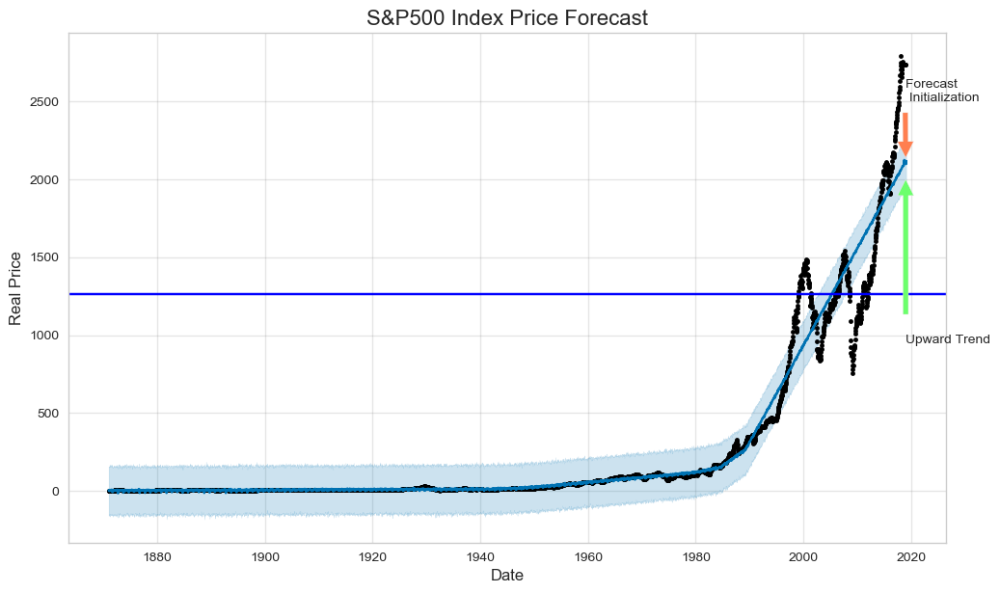

In [114]:
# Dates
starting_date = dt.datetime(2018, 11, 30)
starting_date1 = mdates.date2num(starting_date)
trend_date = dt.datetime(2019, 1, 1)
trend_date1 = mdates.date2num(trend_date)

pointing_arrow = dt.datetime(2019, 1, 1)
pointing_arrow1 = mdates.date2num(pointing_arrow)

# Plot.
fig = fb.plot(future_price)
ax1 = fig.add_subplot(111)
ax1.set_title("S&P500 Index Price Forecast", fontsize=16)
ax1.set_xlabel("Date", fontsize=12)
ax1.set_ylabel("Real Price", fontsize=12)

# Forecast initialization arrow
ax1.annotate('Forecast \n Initialization', xy=(pointing_arrow1, 2100), xytext=(starting_date1,2500),
            arrowprops=dict(facecolor='#ff7f50', shrink=0.1),
            )

# Trend emphasis arrow
ax1.annotate('Upward Trend', xy=(trend_date1, 2108), xytext=(trend_date1,950),
            arrowprops=dict(facecolor='#6cff6c', shrink=0.1),
            )

ax1.axhline(y=1260, color='b', linestyle='-')

plt.show()

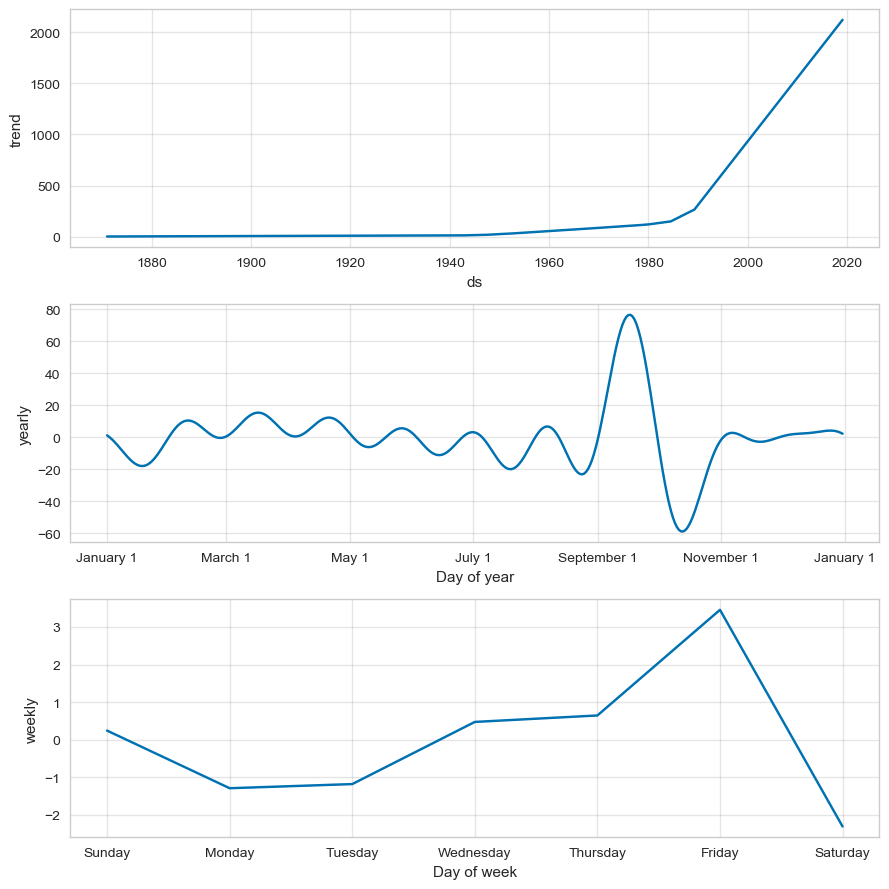

In [115]:
fig2 = fb.plot_components(future_price)
plt.show()

INFO:fbprophet.forecaster:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


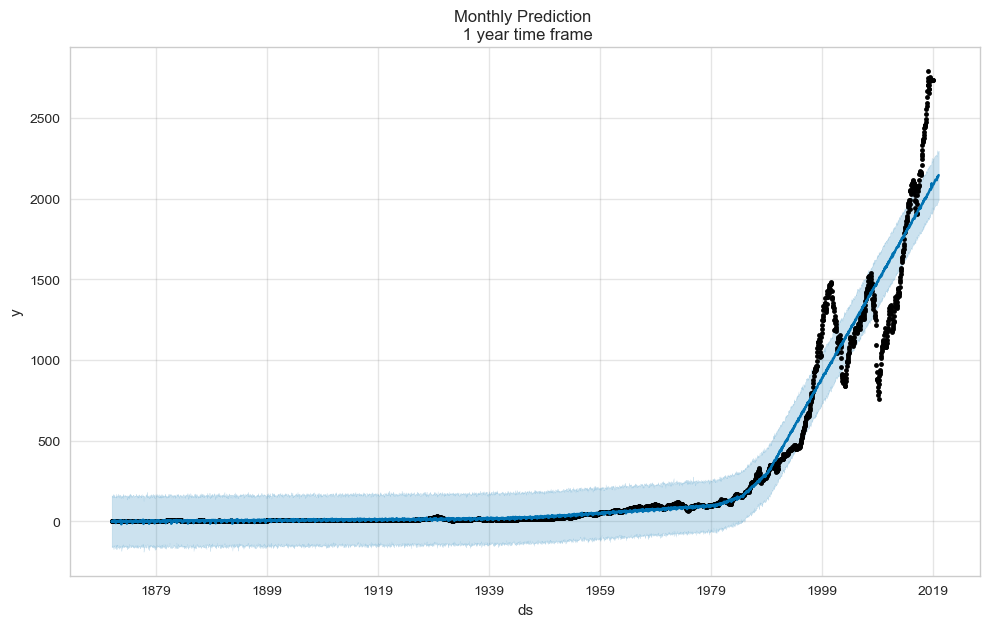

In [116]:
# Monthly Data Predictions
fbm = Prophet(changepoint_prior_scale=0.01).fit(df_interpolate_fb)
future = fbm.make_future_dataframe(periods=12, freq='M')
fcst = fbm.predict(future)
fig = fbm.plot(fcst)
plt.title("Monthly Prediction \n 1 year time frame")

plt.show()

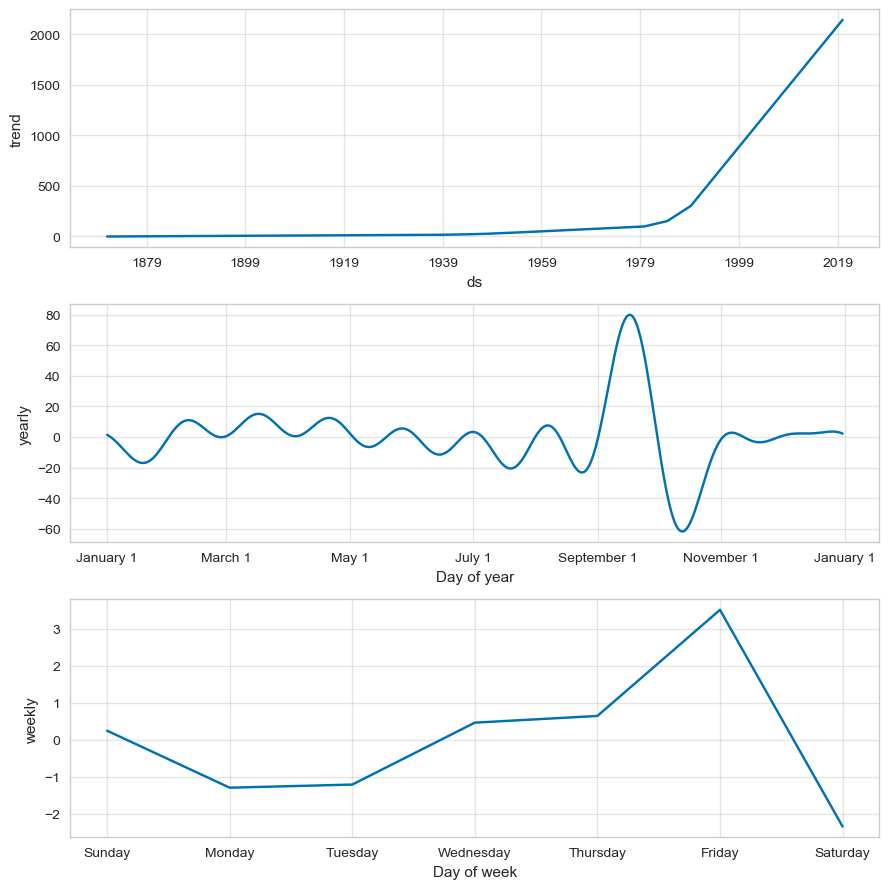

In [117]:
fig3 = fbm.plot_components(fcst)
plt.show()